# Descriptive Analysis:
## Measuring census tract exposure density

* This notebook includes scripts for aggregating microscale exposure density into neighborhood level (census tract level) and exploring measures and spatial distributions.
* Figure 1, Figure 2, Figure S1, Figure S2, and Figure S3 are resulted from this notebook.

---

In [1]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import time
import matplotlib.colors as mcolors
import mapclassify
from multiprocessing import Pool
import seaborn as sns

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_cities = pd.read_csv('../../data/cities_stay_at_home_order_date.csv')
df_cities['City_State'] = df_cities['City']+'_'+df_cities['State']
df_cities['Stay_at_home_order_date'] = pd.to_datetime(df_cities['Stay_at_home_order_date'])
df_cities['Phase1_opening_date'] = pd.to_datetime(df_cities['Phase1_opening_date'])

df_cities = df_cities[['City', 'State', 'Timezone', 'Stay_at_home_order_date', 'Phase1_opening_date', 'Phase1_Shift', 'City_State']]

cities = df_cities['City_State'].tolist()
df_cities

,City,State,Timezone,Stay_at_home_order_date,Phase1_opening_date,Phase1_Shift,City_State
0,New_York_City,NY,EST,2020-03-22,2020-06-08,0,New_York_City_NY
1,Chicago,IL,CST,2020-03-21,2020-05-01,0,Chicago_IL
2,Philadelphia,PA,EST,2020-03-23,2020-05-08,0,Philadelphia_PA
3,Austin,TX,CST,2020-03-24,2020-05-01,0,Austin_TX
4,Jacksonville,FL,EST,2020-04-01,2020-05-05,0,Jacksonville_FL
5,Columbus,OH,EST,2020-03-23,2020-05-01,0,Columbus_OH
6,Charlotte,NC,EST,2020-03-26,2020-05-08,0,Charlotte_NC
7,Indianapolis,IN,EST,2020-03-23,2020-05-11,-4,Indianapolis_IN
8,Seattle,WA,PST,2020-03-23,2020-06-05,0,Seattle_WA
9,Denver,CO,MT,2020-03-26,2020-04-26,0,Denver_CO


In [3]:
folder = ['1_New_York_City_NY',
 '11_Austin_TX',
 '12_Jacksonville_FL',
 '14_Columbus_OH',
 '15_Charlotte_NC',
 '16_San_Francisco_CA',
 '17_Indianapolis_IN',
 '2_Los_Angeles_CA',
 '3_Chicago_IL',
 '4_Houston_TX',
 '6_Philadelphia_PA',
 '8_San_Diego_CA',
 '9_Dallas_TX',
 '18_Seattle_WA',
 '19_Denver_CO',
 '20_Washington_DC',
 '21_Boston_MA',
 '27_Las_Vegas_NV',
 '42_Miami_FL',]

In [4]:
def valid_zip_check(gdf):
    ax = gdf.boundary.plot(color='k', linewidth=0.5, figsize=(6,6))
    gdf[gdf['grid_counts']<=3].boundary.plot(color='red', ax=ax)
    plt.show()

def zip_exp(gdf):
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(20,6))
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax1, alpha=0.3)
    gdf.plot(column='e_pre', ax = ax1,
                     vmin=gdf['e_pre'].quantile(0.1), vmax=gdf['e_pre'].quantile(0.9), #cmap='', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax1.set_title('Exposure risk, pre-covid', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax2, alpha=0.3)
    gdf.plot(column='e_sah', ax = ax2,
                     vmin=gdf['e_pre'].quantile(0.1), vmax=gdf['e_pre'].quantile(0.9),  #cmap='bwr', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax2.set_title('Exposure risk, SaH', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax3, alpha=0.3)
    gdf.plot(column='e_post', ax = ax3,
                     vmin=gdf['e_pre'].quantile(0.1), vmax=gdf['e_pre'].quantile(0.9), #cmap='bwr', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax3.set_title('Exposure risk, Phase1 reopen', fontsize=14)
    plt.tight_layout()
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exp_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exp_%s.svg' %f_city, dpi=300)
    plt.show()
    

def zip_exp_change(gdf):
    fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, sharey=True, figsize=(13,6))
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax1, alpha=0.3)
    gdf.plot(column='e_change_1', ax = ax1,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax1.set_title('Exposure risk change (%) after SaH', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax2, alpha=0.3)
    gdf.plot(column='e_change_2', ax = ax2,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax2.set_title('Exposure risk change (%) after Phase 1 reopen', fontsize=14)
    plt.tight_layout()
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exp_change_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exp_change_%s.svg' %f_city, dpi=300)
    plt.show()

    
def zip_r(gdf):
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(20,6))
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax1, alpha=0.3)
    gdf.plot(column='p_r_pre', ax = ax1,
                     vmin=gdf['p_r_pre'].quantile(0.1), vmax=gdf['p_r_pre'].quantile(0.9), #cmap='', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax1.set_title('Residential activity (%), pre-covid', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax2, alpha=0.3)
    gdf.plot(column='p_r_sah', ax = ax2,
                     vmin=gdf['p_r_pre'].quantile(0.1), vmax=gdf['p_r_pre'].quantile(0.9),  #cmap='bwr', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax2.set_title('Residential activity (%), SaH', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax3, alpha=0.3)
    gdf.plot(column='p_r_post', ax = ax3,
                     vmin=gdf['p_r_pre'].quantile(0.1), vmax=gdf['p_r_pre'].quantile(0.9), #cmap='bwr', 
                      legend=True, legend_kwds={'shrink': 0.3})
    ax3.set_title('Redisdential activity (%), Phase1 reopen', fontsize=14)
    plt.tight_layout()
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_residential_activity_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_residential_activity_%s.svg' %f_city, dpi=300)
    plt.show()
    
    
def zip_pct_change_1(gdf):
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(20,6))
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax1, alpha=0.3)
    gdf.plot(column='p_r_change_1_norm', ax = ax1,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax1.set_title('Res activity change (% normalized) after SaH', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax2, alpha=0.3)
    gdf.plot(column='p_nr_change_1_norm', ax = ax2,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax2.set_title('NonRes activity change (% normalized) \n after SaH', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax3, alpha=0.3)
    gdf.plot(column='p_o_change_1_norm', ax = ax3,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax3.set_title('Outdoor activity change (% normalized) \n after SaH', fontsize=14)
    plt.tight_layout()
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_outdoor_activity_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_outdoor_activity_%s.svg' %f_city, dpi=300)
    plt.show()
    
    
def zip_pct_change_2(gdf):
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(20,6))
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax1, alpha=0.3)
    gdf.plot(column='p_r_change_2_norm', ax = ax1,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax1.set_title('Res activity change (% normalized) \n after Phase 1 reopen', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax2, alpha=0.3)
    gdf.plot(column='p_nr_change_2_norm', ax = ax2,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax2.set_title('NonRes activity change (% normalized) \n after Phase 1 reopen', fontsize=14)
    gdf.boundary.plot(color='k', figsize=(10,10), linewidth=0.3, ax=ax3, alpha=0.3)
    gdf.plot(column='p_o_change_2_norm', ax = ax3,
                     vmin=-0.5, vmax=0.5, cmap='bwr', legend=True, legend_kwds={'shrink': 0.3})
    ax3.set_title('Outdoor activity change (% normalized) \n after Phase 1 reopen', fontsize=14)
    plt.tight_layout()
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_nonresidential_activity_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_nonresidential_activity_%s.svg' %f_city, dpi=300)
    plt.show()
    
    
def kde(gdf):
    fig, ax = plt.subplots()
    sns.kdeplot(gdf['e_change_1'][gdf['e_change_1']!=np.inf], 
            color = 'darkblue', label='SaH %.2f' %gdf['e_change_1'].median(), ax=ax, legend=True
            )
    x = ax.lines[-1].get_xdata()
    y = ax.lines[-1].get_ydata()
    x_special = 0
    ax.vlines(x_special, 0, np.interp(x_special, x, y), linestyle='--', color='grey', alpha=0.5)
    ax.fill_between(x, 0, y, where=x < x_special, color='grey', alpha=0.2)
    plt.xlim(-1, 1)
    plt.ylim(0,2.7)
    plt.box(False)
    sns.kdeplot(gdf['e_change_2'][gdf['e_change_2']!=np.inf], 
                color = 'darkblue', label='Reopen %.2f' %gdf['e_change_2'].median(), linestyle='--')
    plt.title('Exposure risk change, %s' %city)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_kde_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_kde_%s.svg' %f_city, dpi=300)
    plt.show()

20_Washington_DC


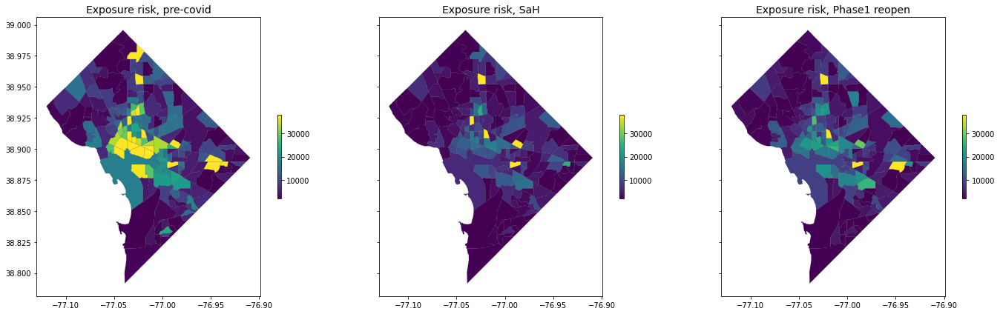

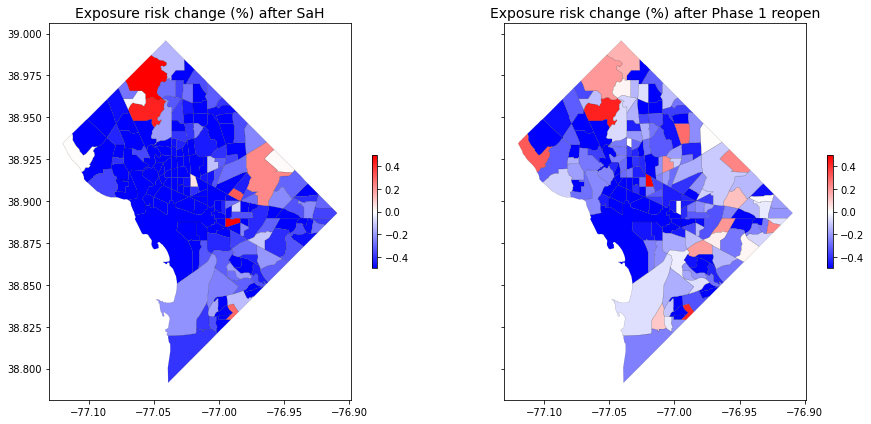

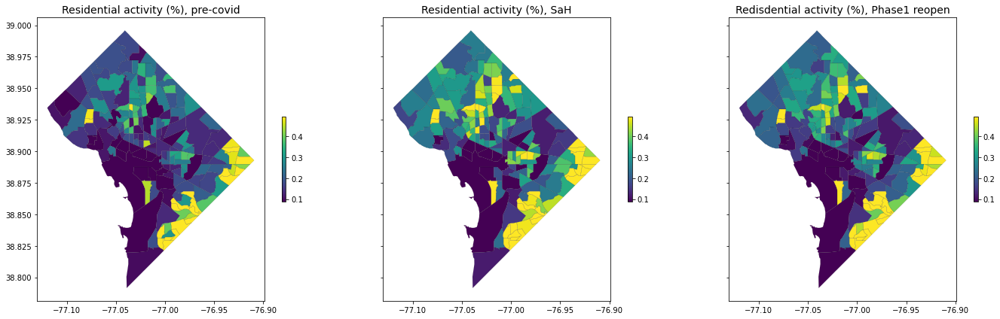

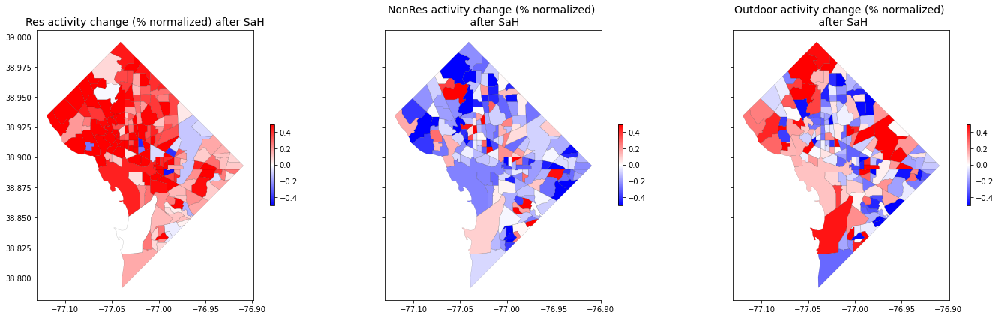

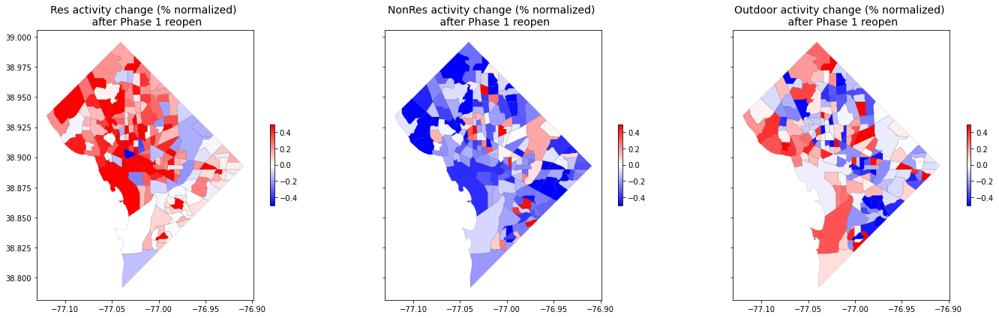

11_Austin_TX


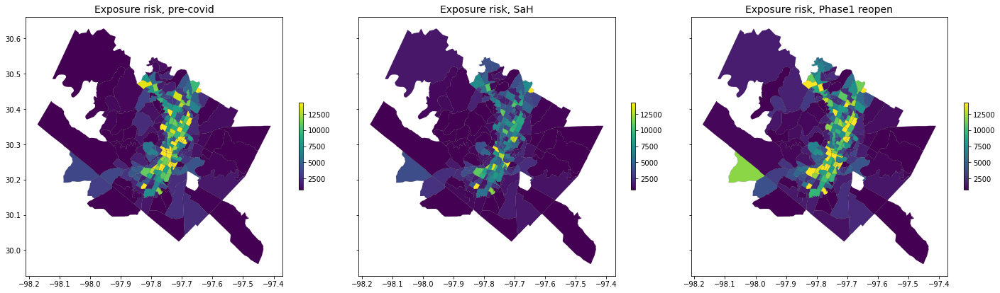

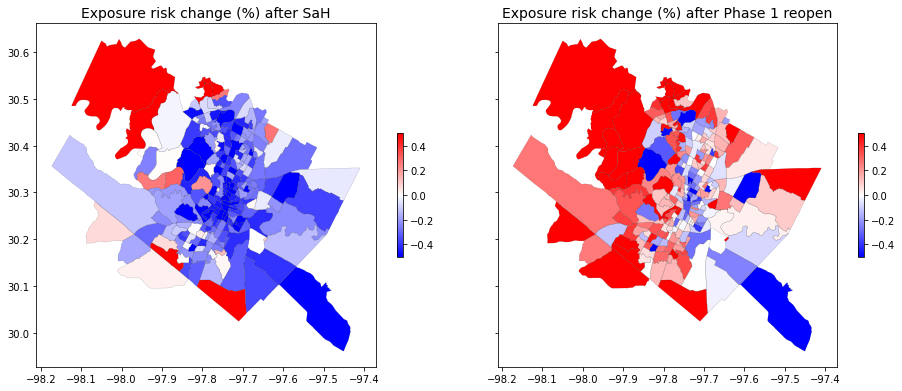

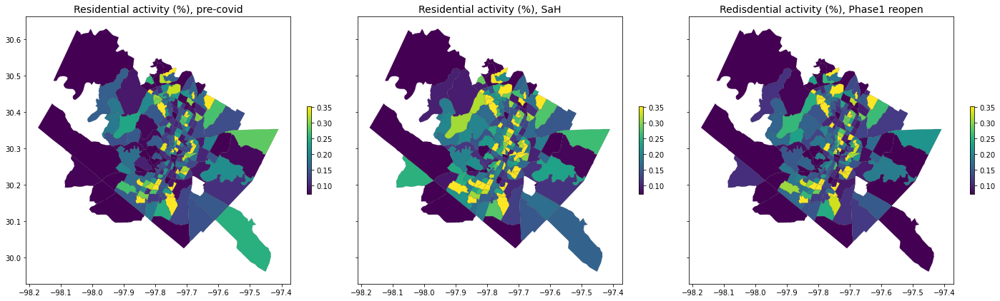

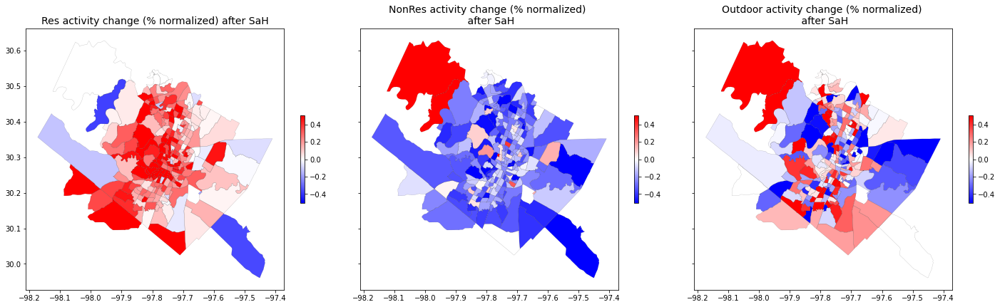

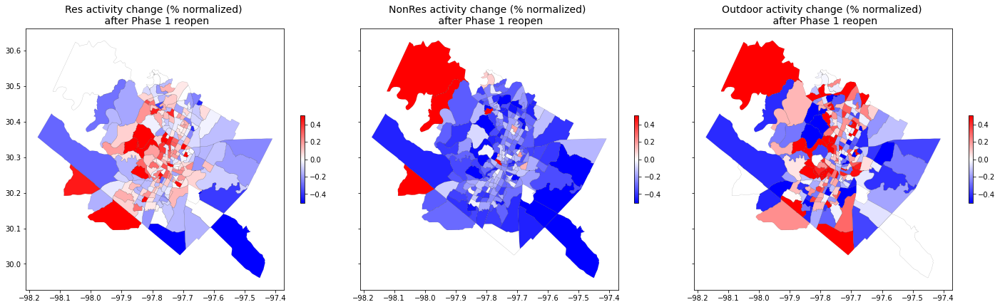

18_Seattle_WA


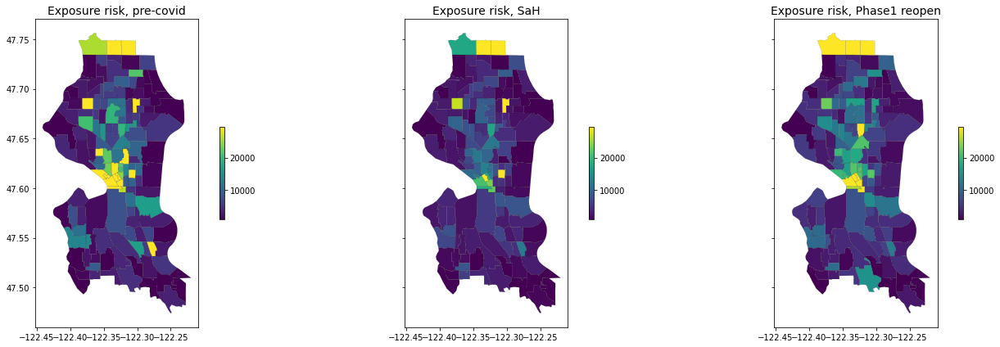

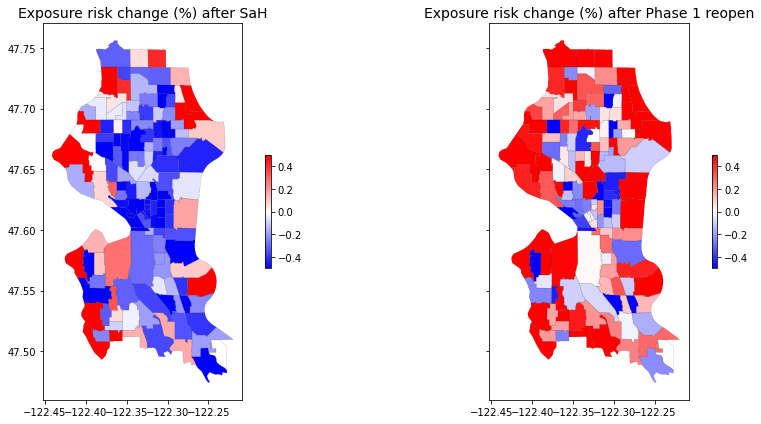

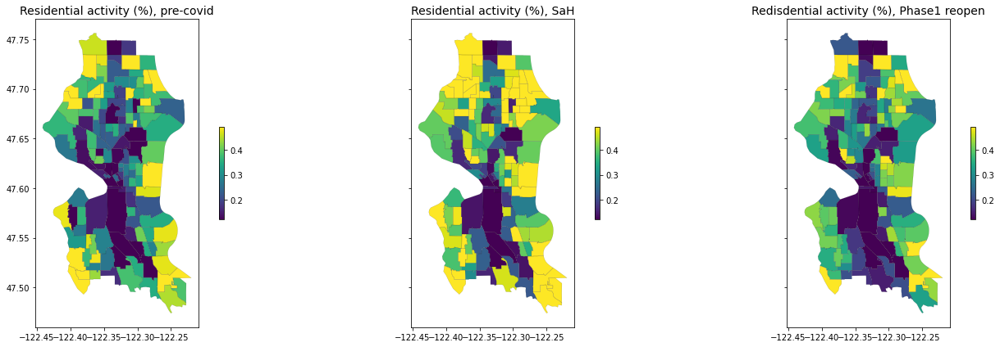

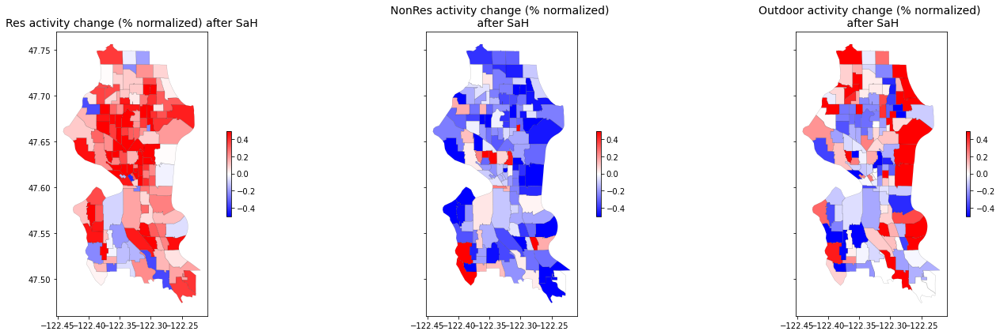

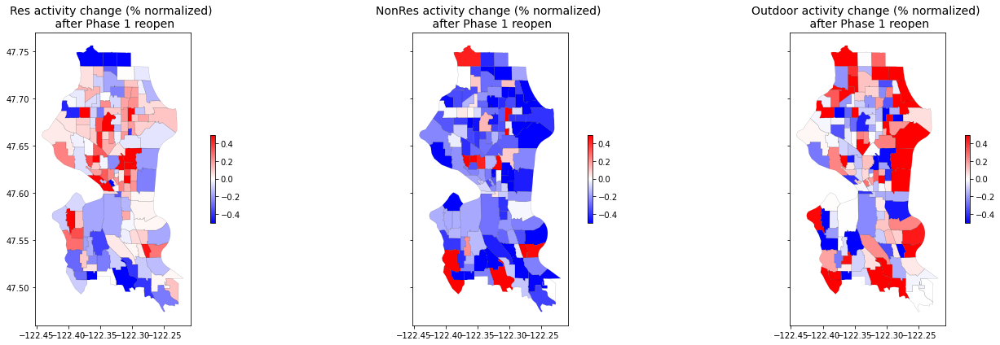

1_New_York_City_NY


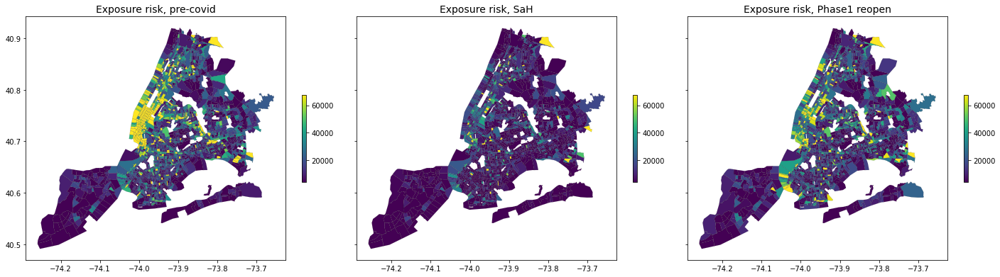

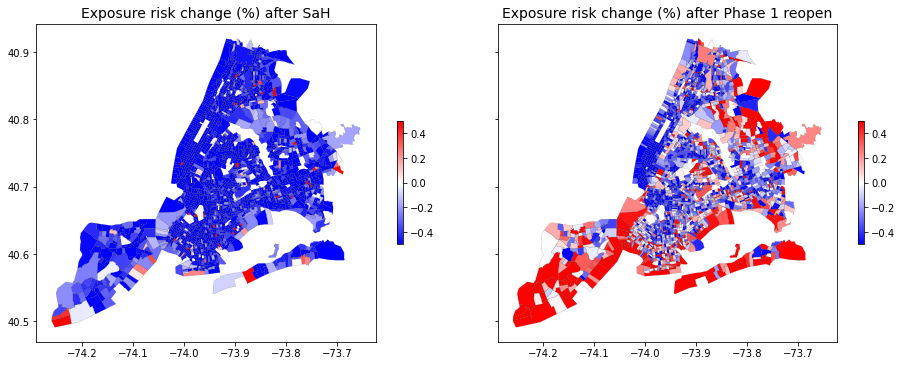

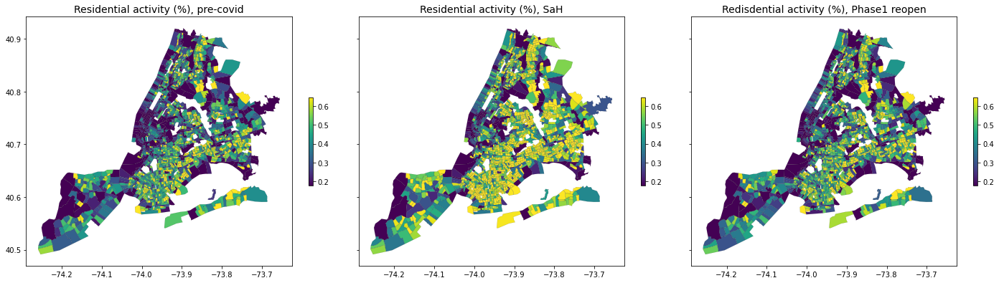

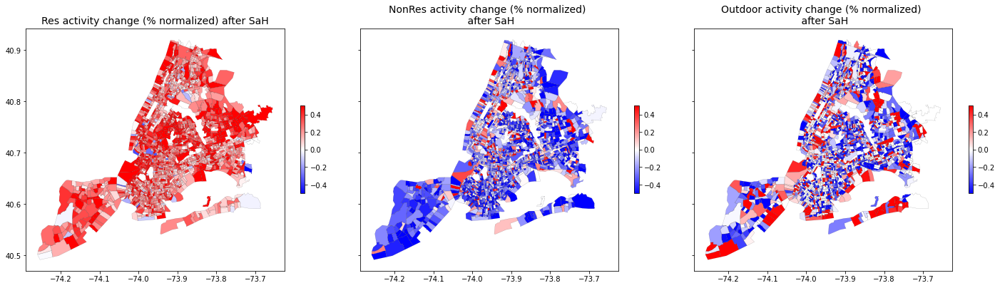

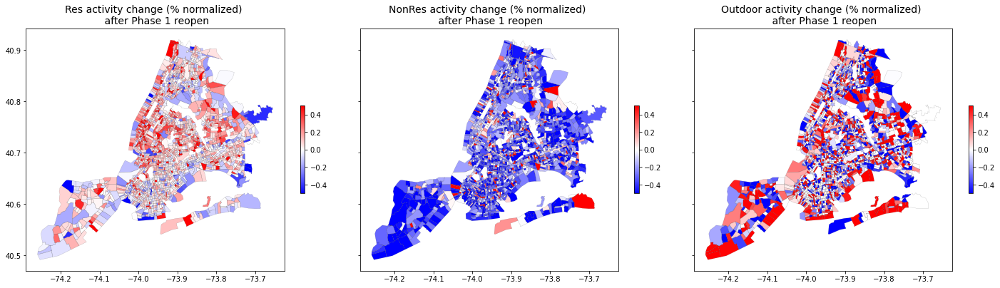

12_Jacksonville_FL


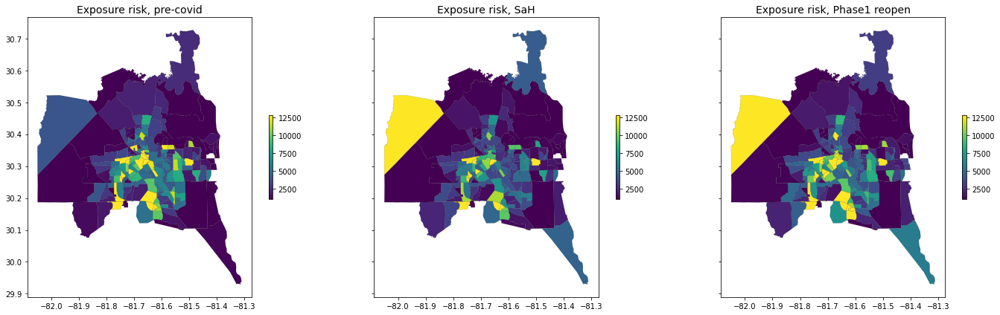

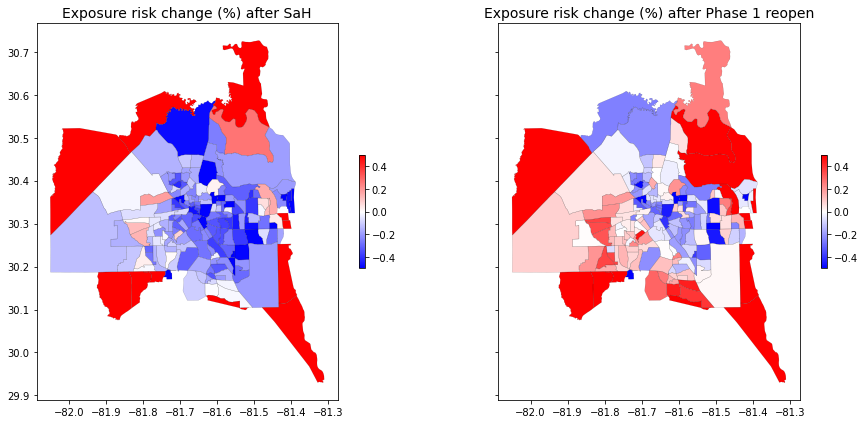

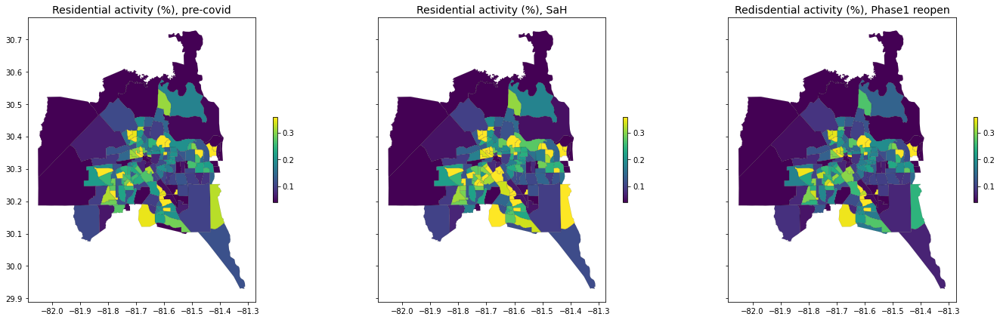

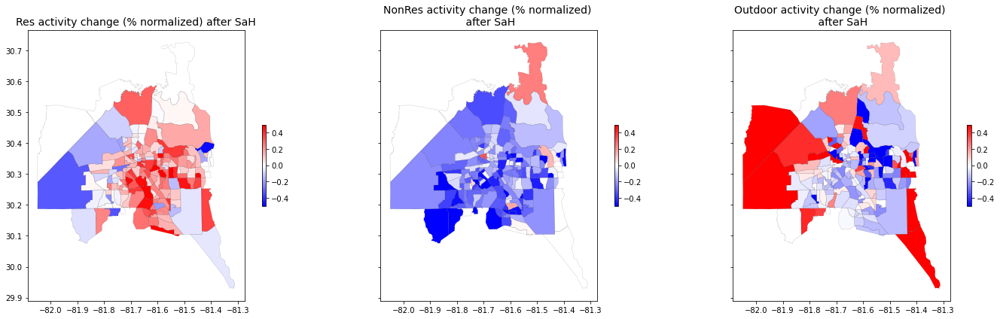

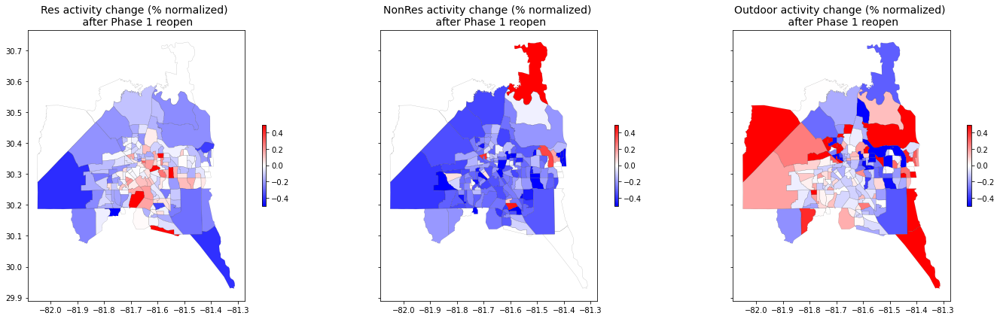

14_Columbus_OH


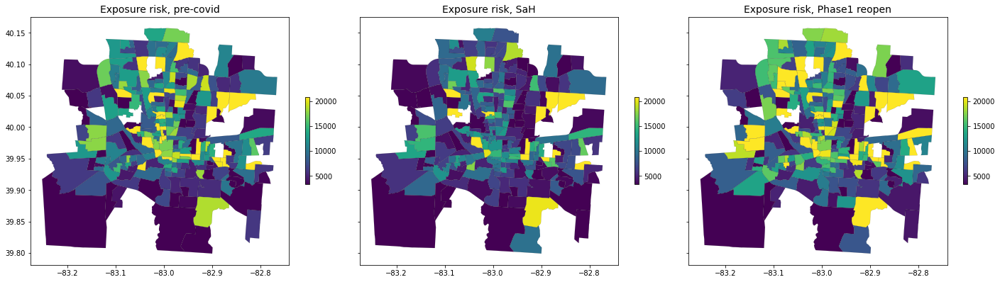

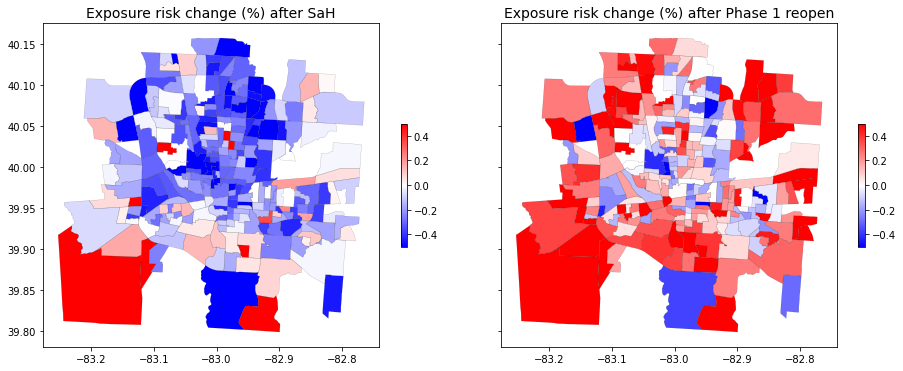

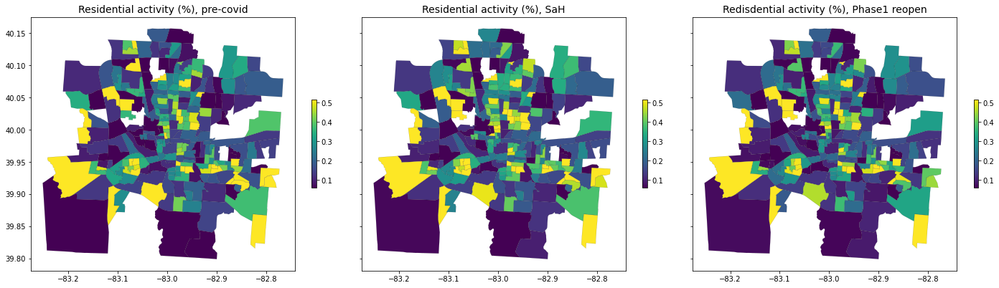

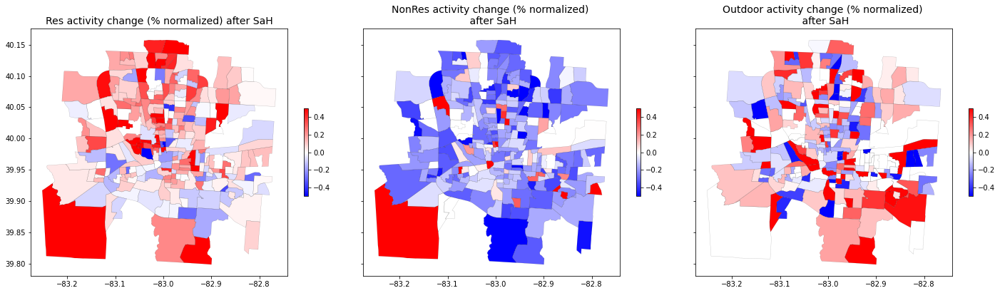

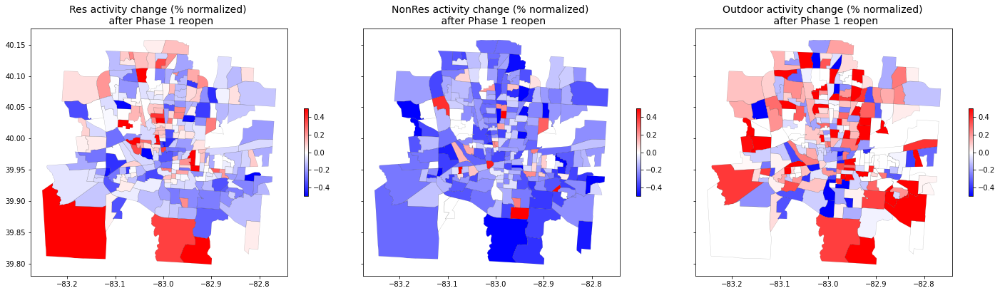

15_Charlotte_NC


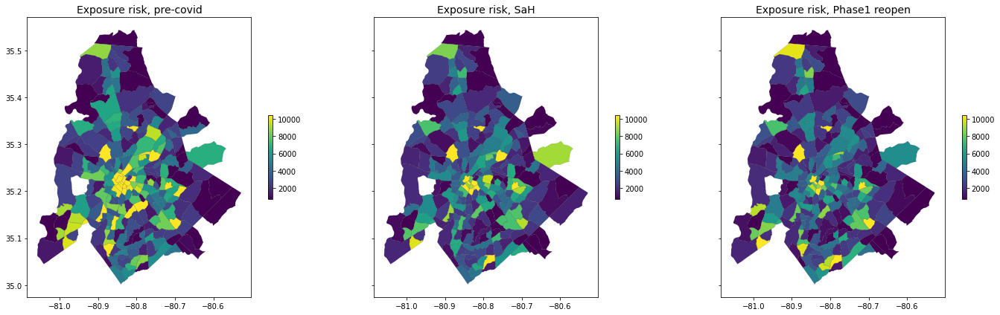

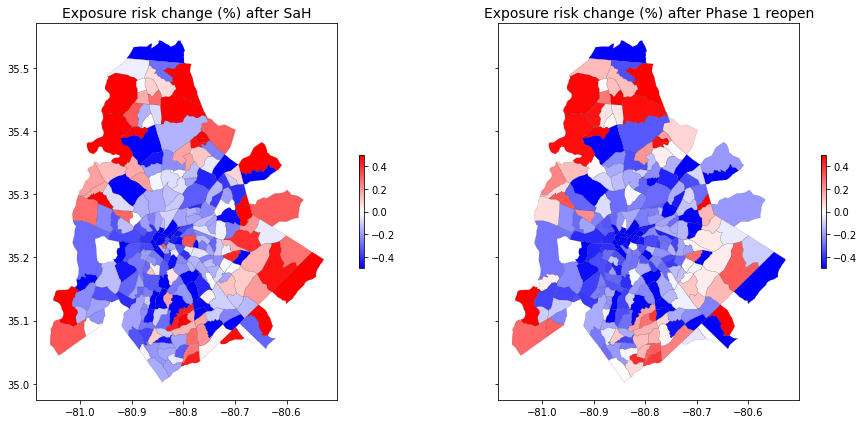

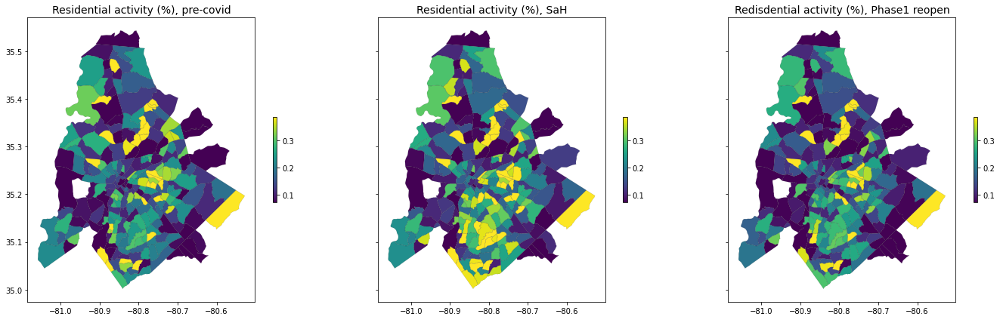

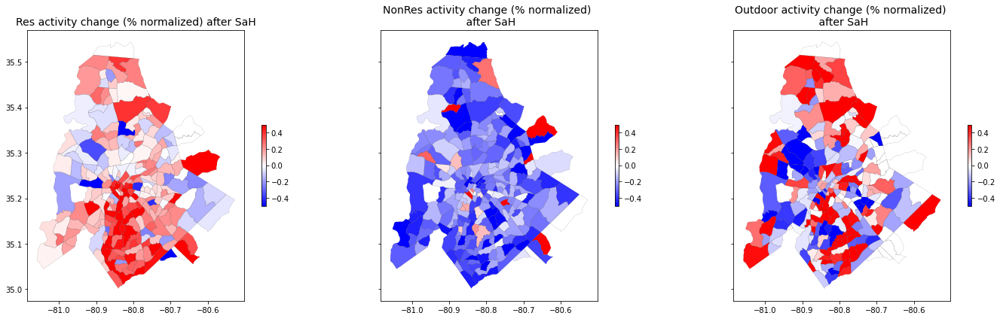

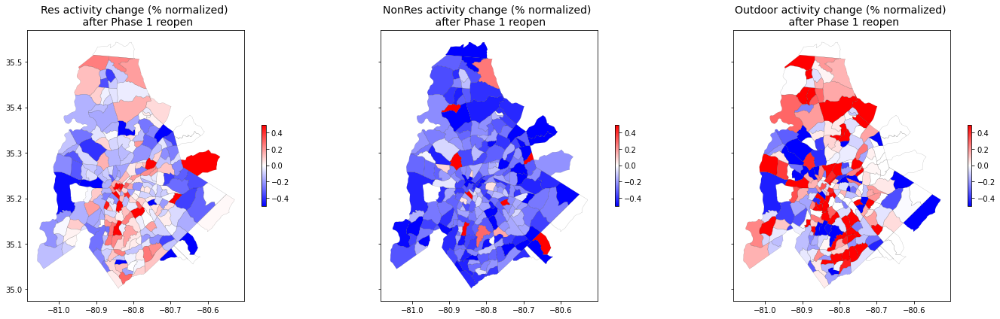

17_Indianapolis_IN


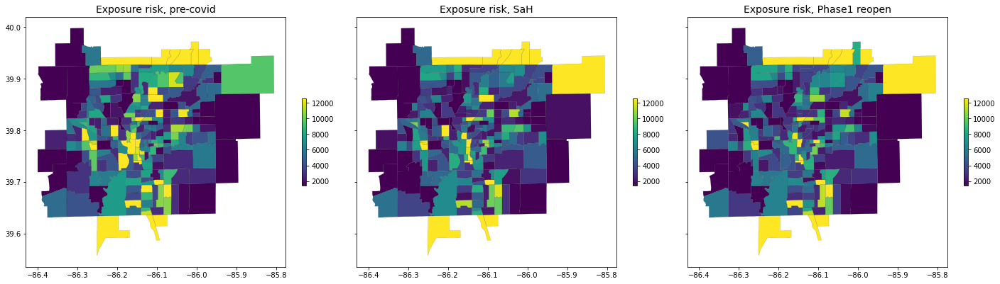

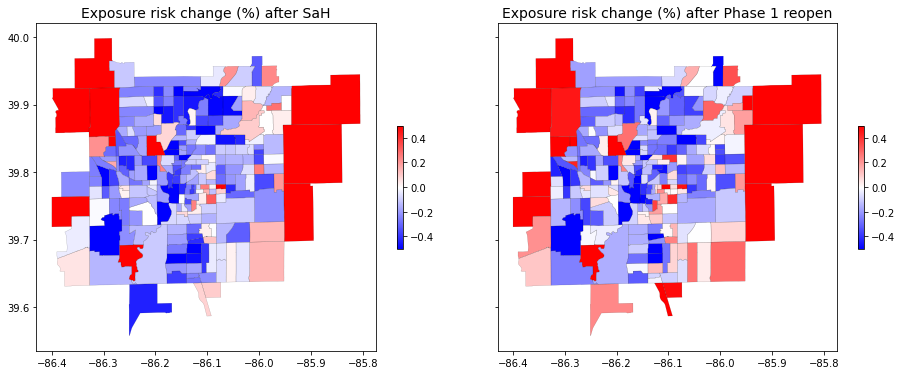

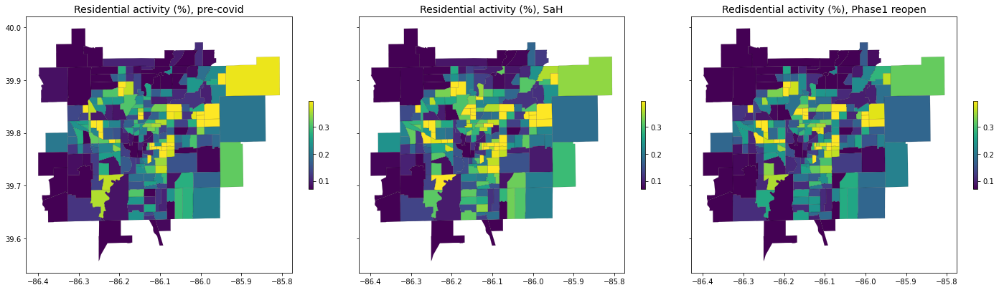

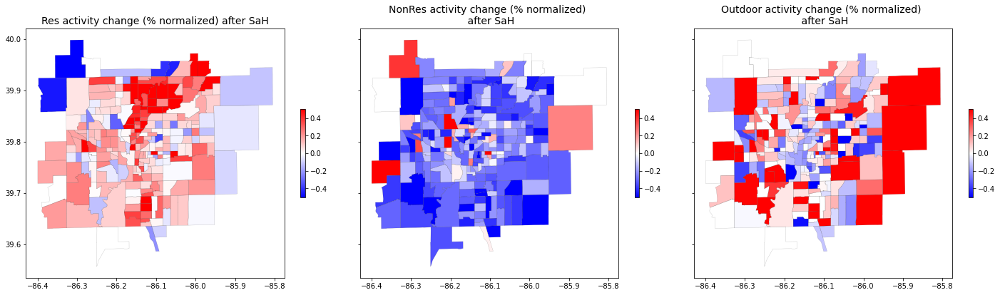

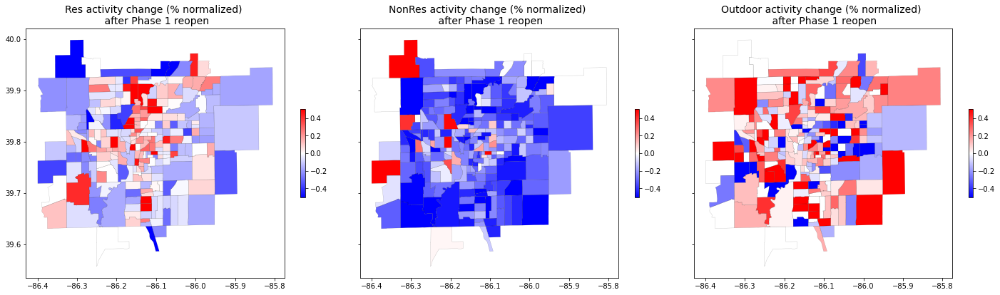

3_Chicago_IL


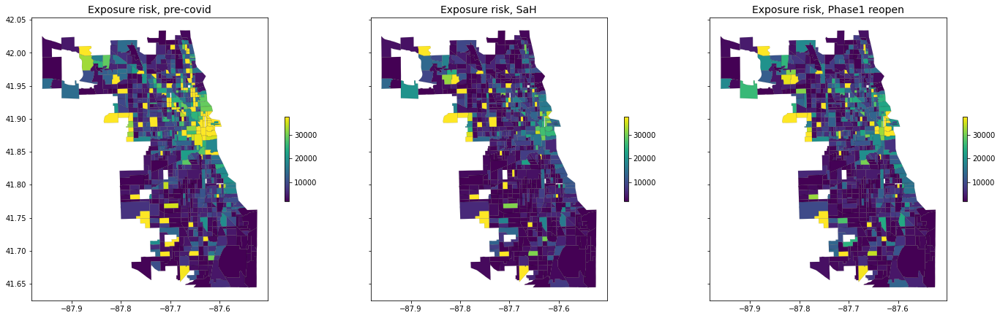

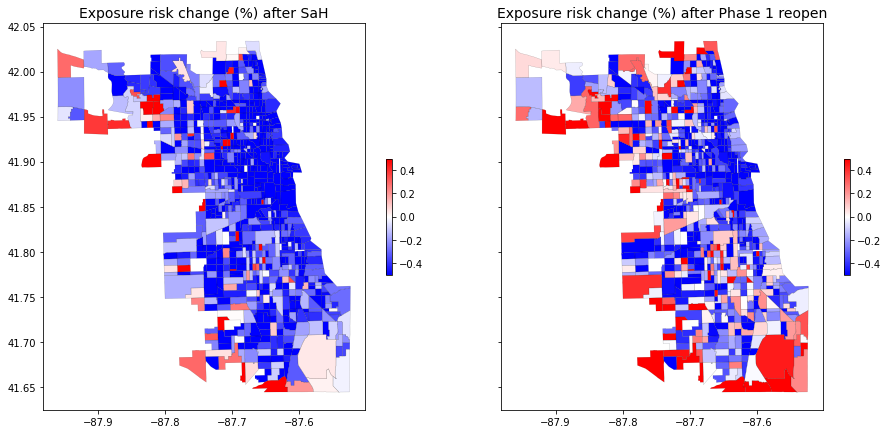

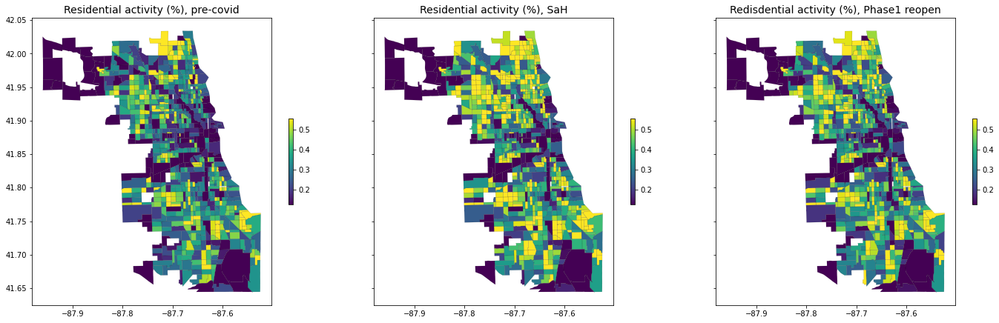

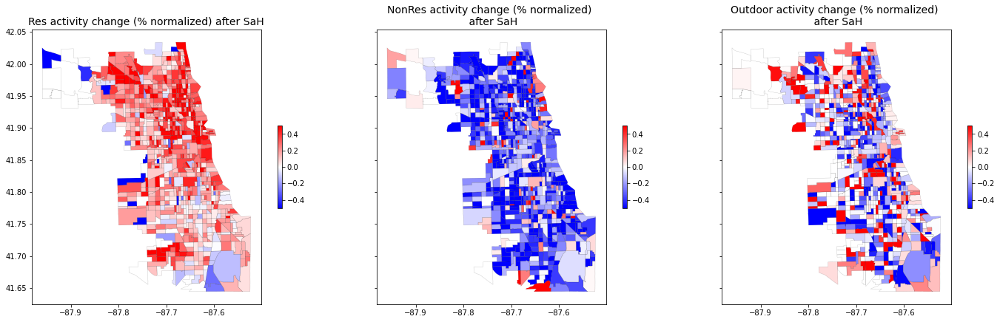

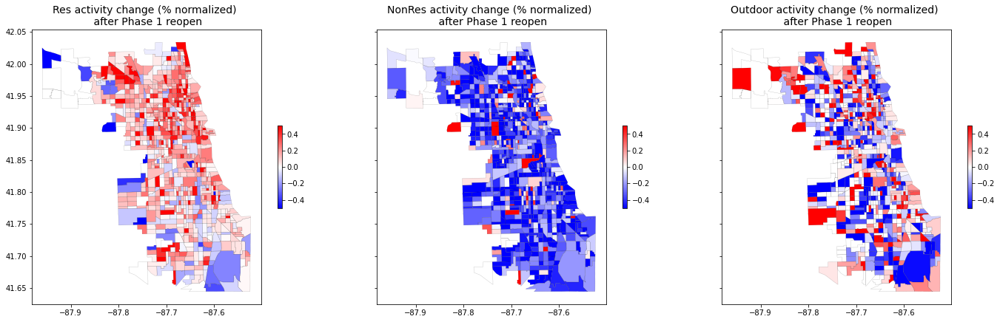

6_Philadelphia_PA


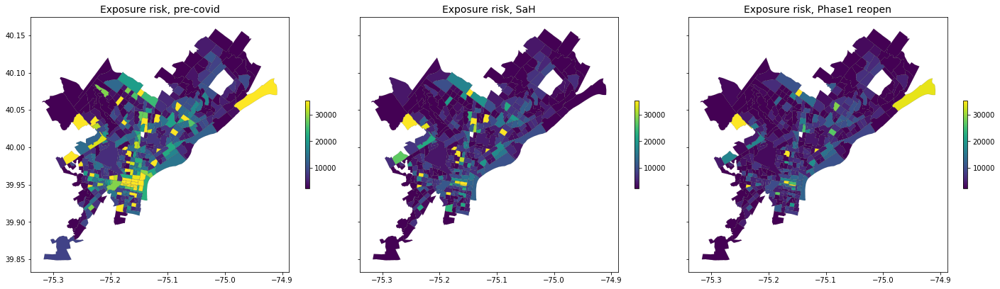

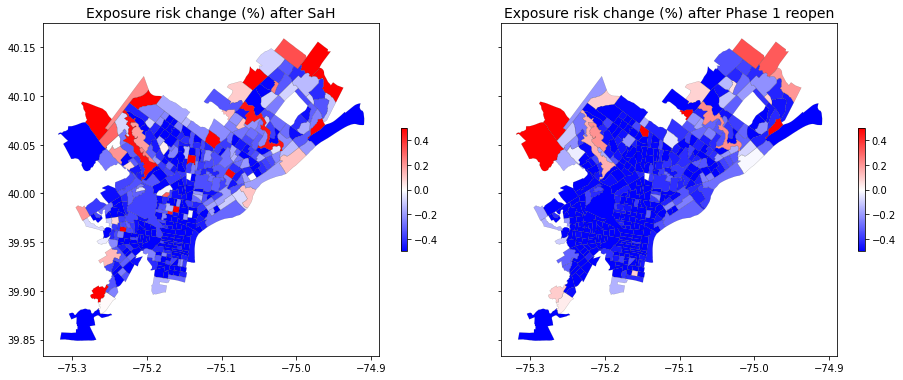

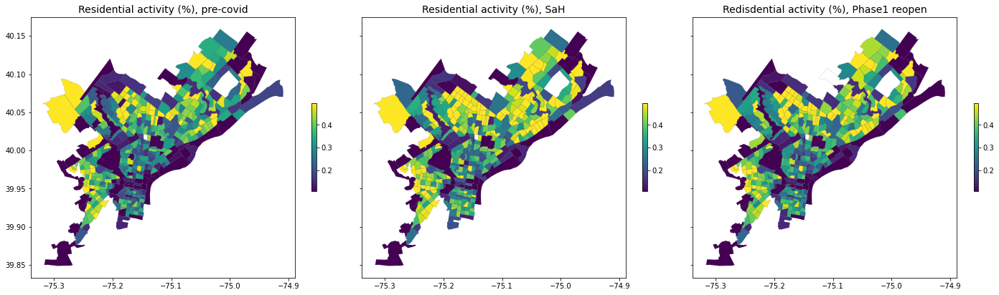

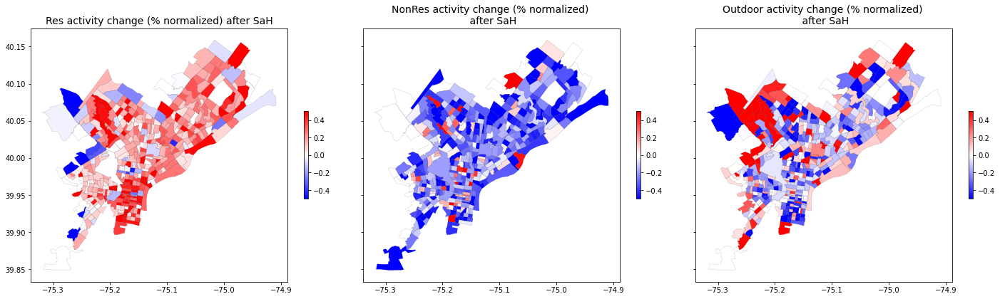

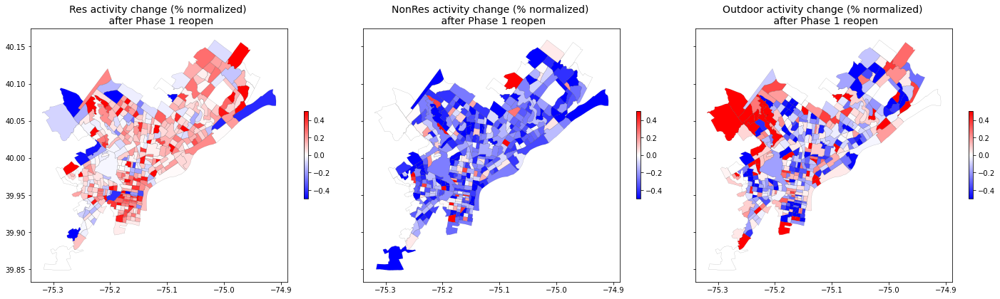

9_Dallas_TX


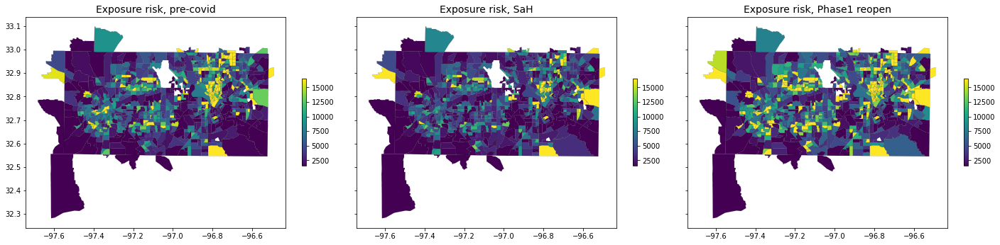

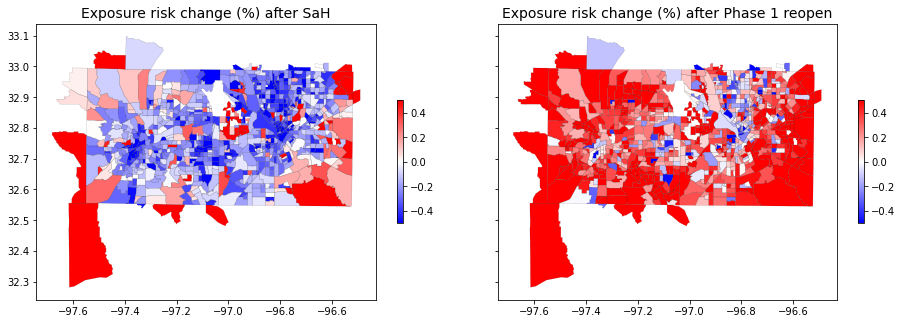

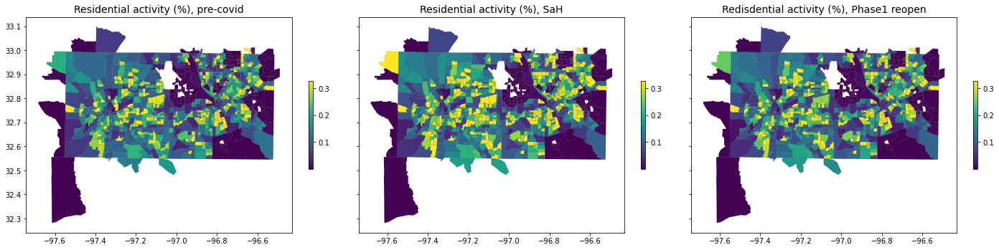

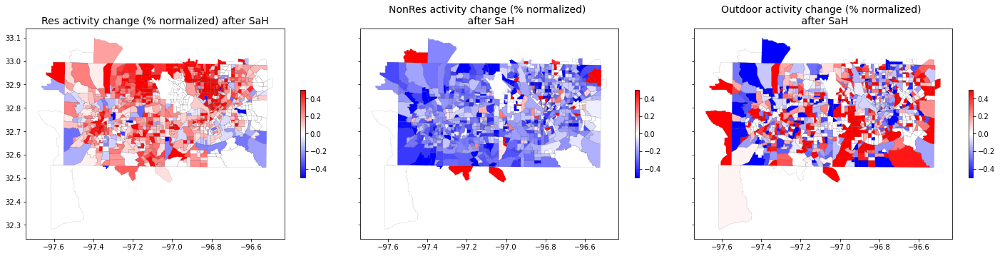

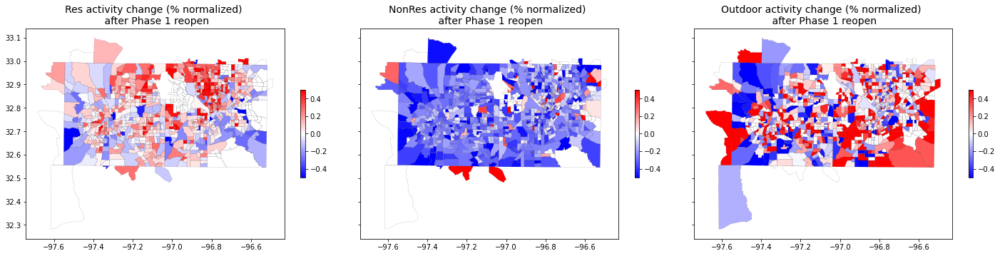

19_Denver_CO


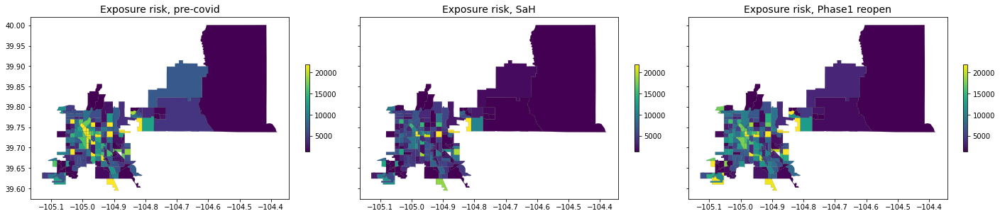

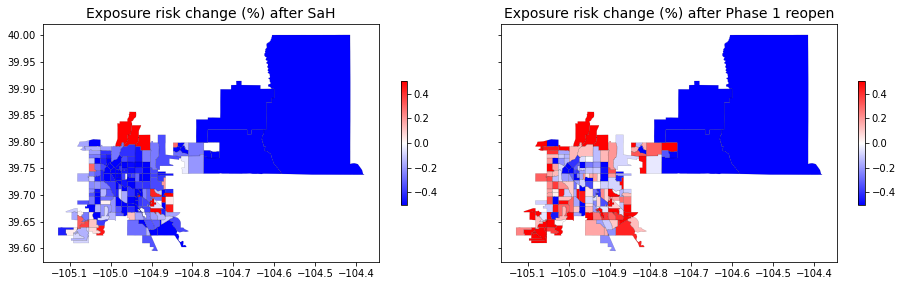

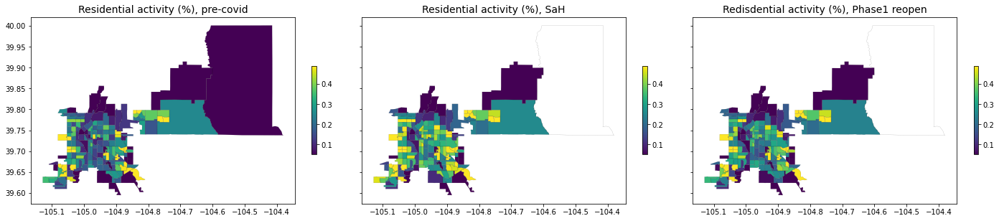

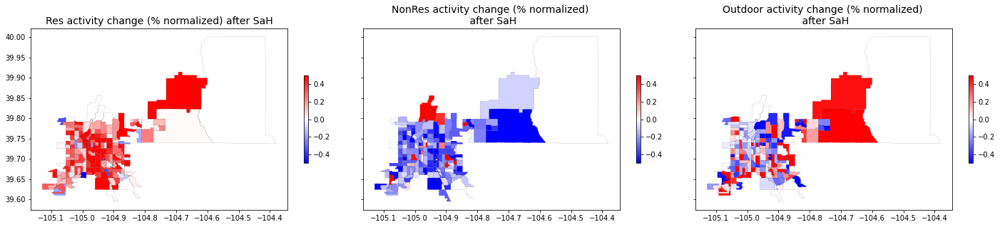

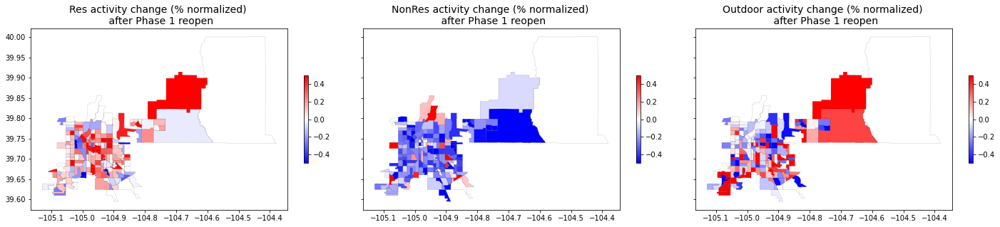

21_Boston_MA


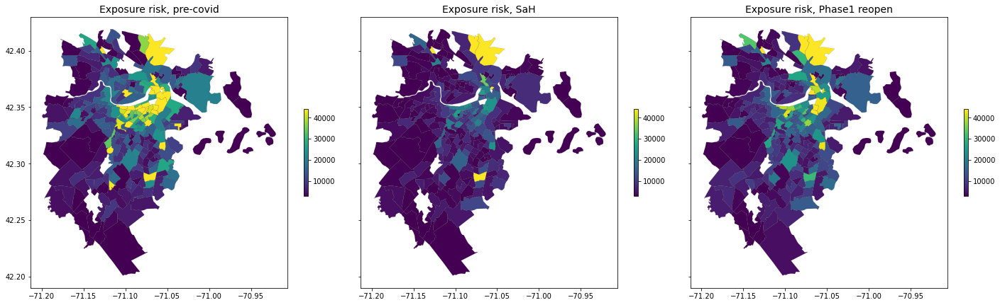

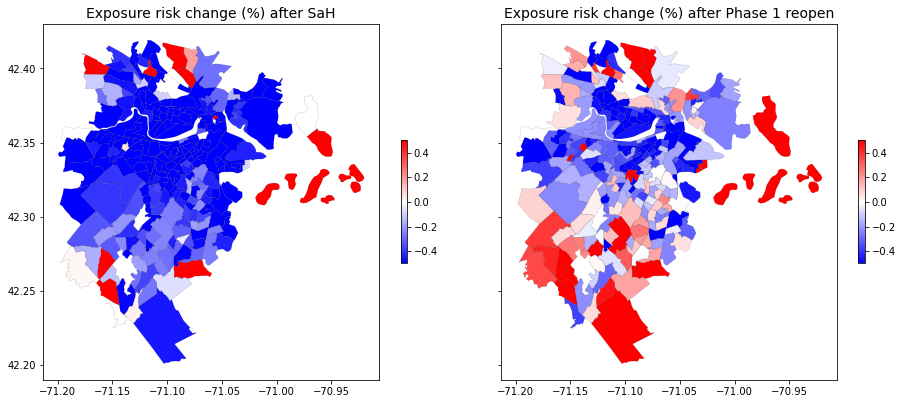

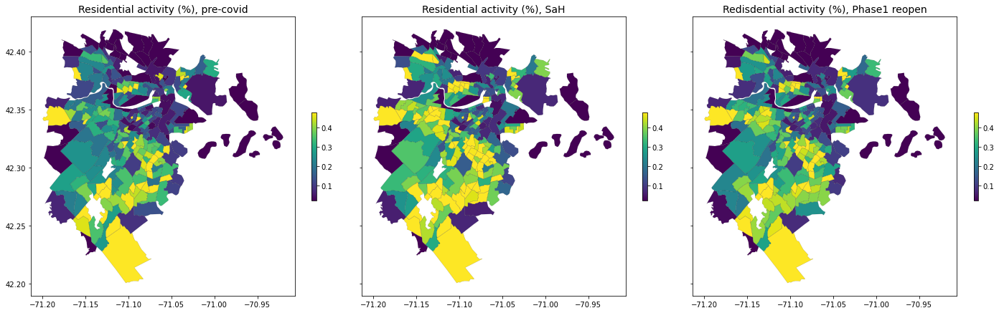

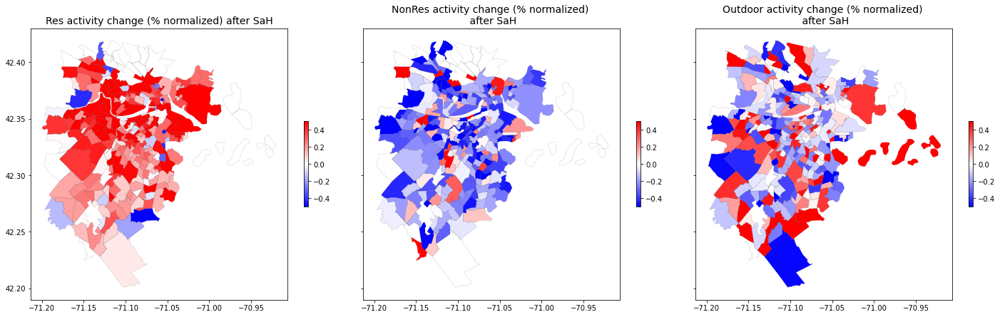

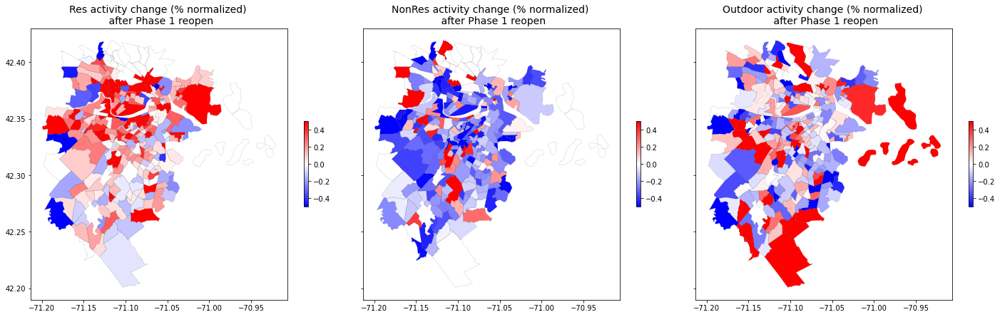

27_Las_Vegas_NV


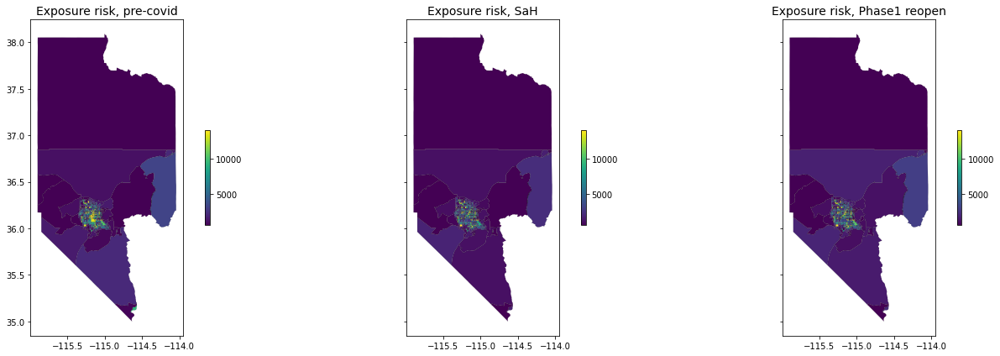

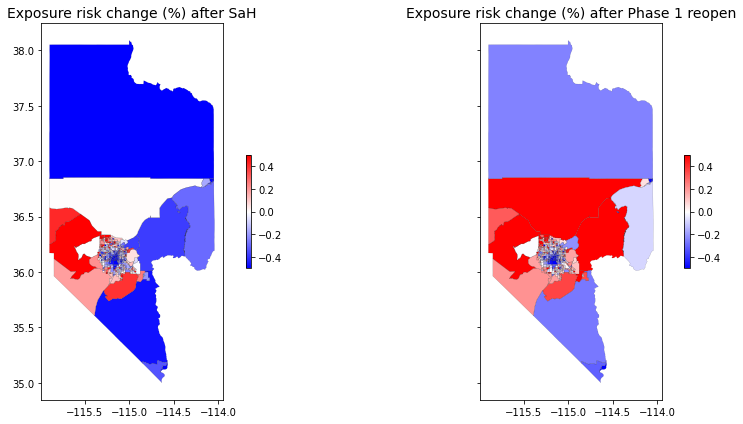

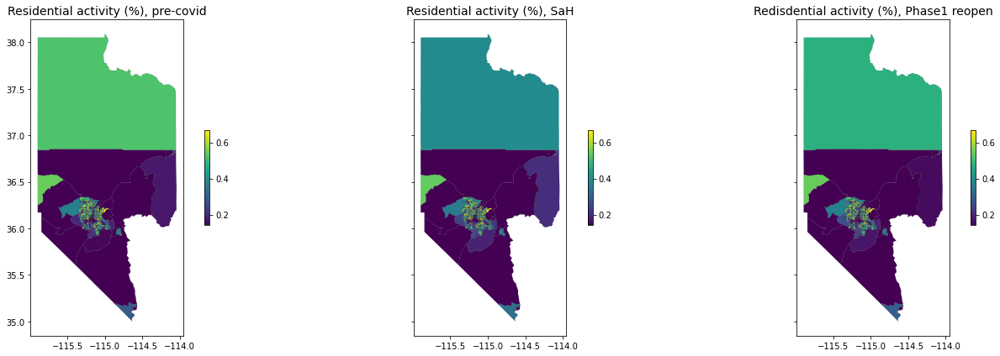

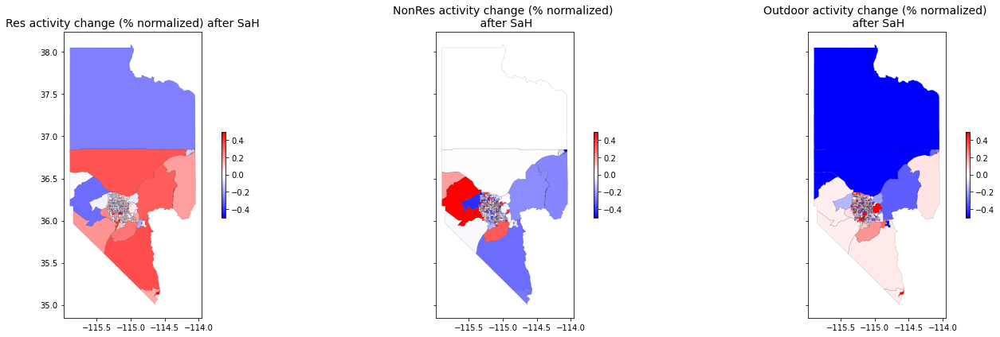

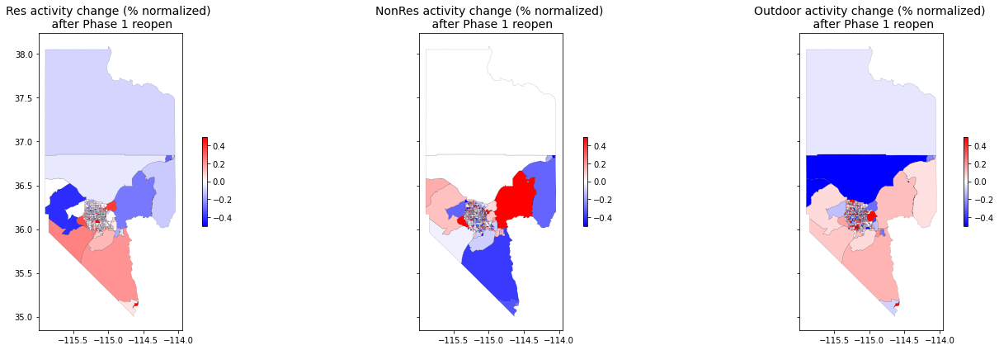

42_Miami_FL


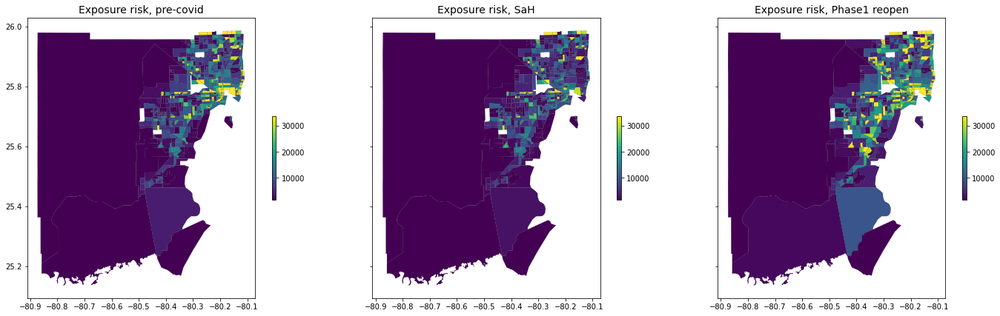

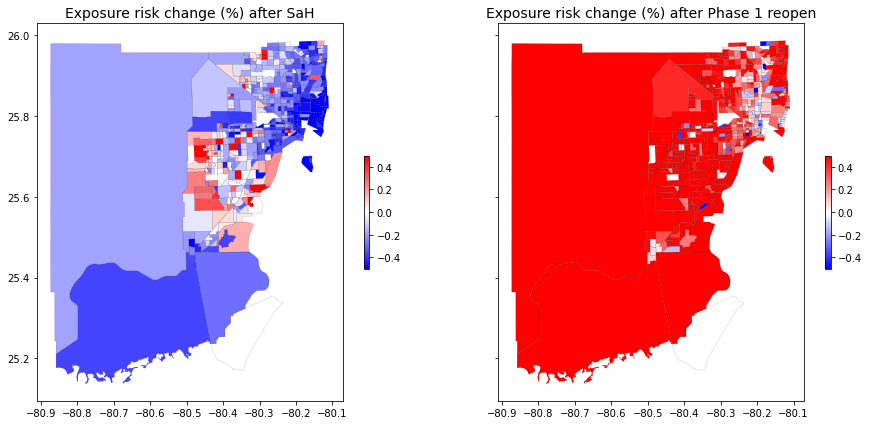

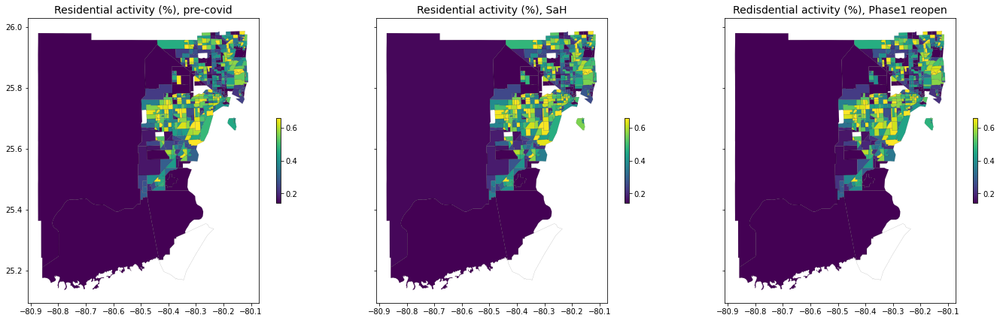

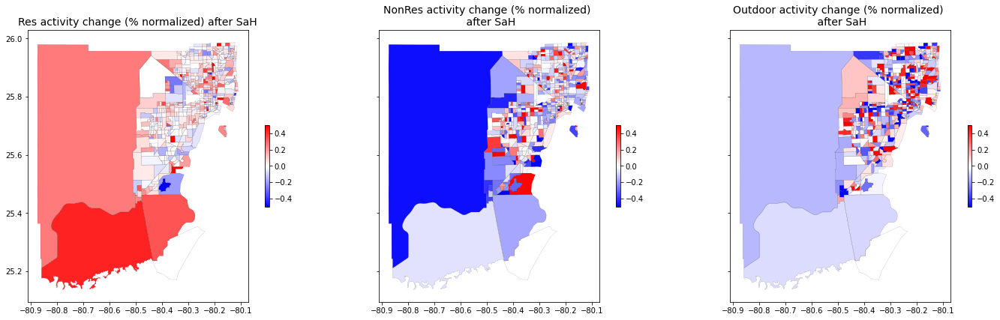

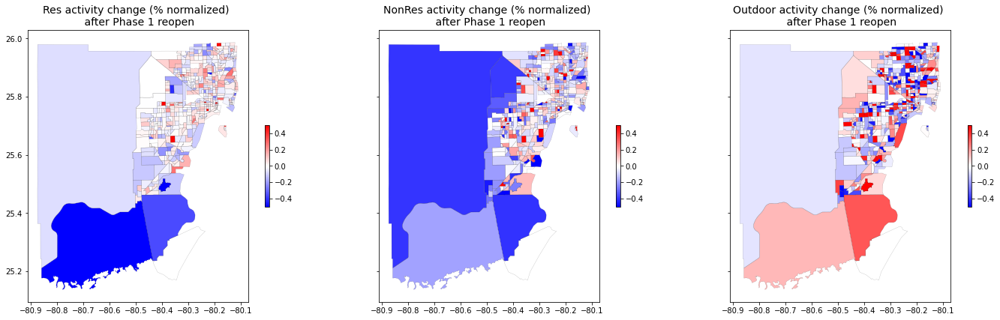

In [5]:
for c in ['Washington_DC','Austin_TX','Seattle_WA',
         'New_York_City_NY','Jacksonville_FL','Columbus_OH','Charlotte_NC',
         'Indianapolis_IN','Chicago_IL',
         'Philadelphia_PA','Dallas_TX','Denver_CO','Boston_MA',
         'Las_Vegas_NV','Miami_FL'
         ]:
    
    city = cities[cities.index(c)] # this will change every iteration
    state = df_cities[df_cities['City_State']==city]['State'].values[0]

    # specify city 
    f_city = [f for f in folder if city in f][0]
    print (f_city)
    
    # load processed file (grid cell level exposure risk per period)
    fp = '../../output/grid_exp_change_new_landuse_category/grid_exp_change_per_period_new_landuse_category_%s.csv' %f_city
    df = pd.read_csv(fp)
    
    # grid
    fp = '/scratch/share/UIL/VenPath/Output/covid/multi_city/'+ f_city 
    grid = pd.read_parquet(fp+'/250mGrid_LUclasses_07022021.parquet')

    # landuse categorization
    grid['label'] = 'NN'
    grid['label'][grid['class'].isin([1,50,51,90])] = 'O'
    grid['label'][grid['class'].isin([30,31,60,61,91,110,111,])] = 'NR'
    grid['label'][grid['class'].isin([10,11,20,21,40,41])] = 'R'
    grid['label'][grid['class'].isin([80,81,100,101])] = 'V'
    grid['label'][grid['class'].isin([3,70,71,200,201])] = 'IN'
    grid['label'][grid['class'].isin([120,121])] = 'IN'

    # convert grid cell info to Geopandas Geodataframe
    gdf_grid = gpd.GeoDataFrame(grid, 
                                geometry=gpd.points_from_xy(grid.cell_250m_lon, grid.cell_250m_lat))

    # geography
    geography = gpd.read_file('/green-projects/project-mobility_patterns_using_mobile_location_data/workspace/share/data/acs5_2018_ct/shapefiles/ct_2018.shp',
                         )
    pop_ct = pd.read_csv('../../output/demographic_ct.csv', dtype={'GEOID':str})
    geography = pd.merge(geography, pop_ct[['GEOID','pop','state']], on='GEOID', how='left')
    geography = geography.rename(columns={'pop':'POP', 'state':'STATE'})
    geography['STATE'] = geography['STATE'].str.upper()
    
    geography['POP'] = geography['POP'].fillna(0)
    geography['POP'] = geography['POP'].astype(float)
    geography = geography[(geography['POP']>10) & (geography['STATE']==state)].reset_index(drop=True)
    geography_4326 = geography.to_crs({'init': 'epsg:4326'})
    
    grid_geography = gpd.sjoin(gdf_grid[gdf_grid['label']!='NN'], geography_4326, how='left', op='within')
    
    grid_geography = grid_geography[['cell_index', 'x_250m_cell', 'y_250m_cell', 'cell_250m_lon', 'cell_250m_lat',
                                'geometry', 'GEOID']].drop_duplicates().reset_index(drop=True)
    
    df = pd.merge(df, grid_geography[['cell_index','GEOID']], on='cell_index', how='left')
    
    # Neihgborhood level grid counts
    df_g_count = df.groupby('GEOID').count().reset_index()
    df_g_count = df_g_count[['GEOID','cell_index']]
    df_g_count.columns = ['GEOID', 'grid_counts']
    
    # Neighborhood level exposure risk
    df['e_pre_a'] = df['e_pre']*df['area_nr_o']
    df['e_sah_a'] = df['e_sah']*df['area_nr_o']
    df['e_post_a'] = df['e_post']*df['area_nr_o']
    
    df['r_pre'] = df['users_pre'] * df['p_r_pre']
    df['r_sah'] = df['users_sah'] * df['p_r_sah']
    df['r_post'] = df['users_post'] * df['p_r_post']

    df['nr_pre'] = df['users_pre'] * df['p_nr_pre']
    df['nr_sah'] = df['users_sah'] * df['p_nr_sah']
    df['nr_post'] = df['users_post'] * df['p_nr_post']

    df['o_pre'] = df['users_pre'] * df['p_o_pre']
    df['o_sah'] = df['users_sah'] * df['p_o_sah']
    df['o_post'] = df['users_post'] * df['p_o_post']

    df['v_pre'] = df['users_pre'] * df['p_v_pre']
    df['v_sah'] = df['users_sah'] * df['p_v_sah']
    df['v_post'] = df['users_post'] * df['p_v_post']

    df['in_pre'] = df['users_pre'] * df['p_in_pre']
    df['in_sah'] = df['users_sah'] * df['p_in_sah']
    df['in_post'] = df['users_post'] * df['p_in_post']

    df_zip_sum = df.groupby('GEOID').sum().reset_index()

    df_zip_sum['e_pre'] = df_zip_sum['e_pre_a']/df_zip_sum['area_nr_o']
    df_zip_sum['e_sah'] = df_zip_sum['e_sah_a']/df_zip_sum['area_nr_o']
    df_zip_sum['e_post'] = df_zip_sum['e_post_a']/df_zip_sum['area_nr_o']

    df_zip_sum = df_zip_sum[['GEOID','area_nr_o', 'e_pre', 'e_sah', 'e_post',
                            'r_pre', 'r_sah', 'r_post', 'nr_pre', 'nr_sah', 'nr_post',
                        'o_pre', 'o_sah', 'o_post', 'v_pre', 'v_sah', 'v_post',
                            'in_pre', 'in_sah', 'in_post']]

    df_zip = pd.merge(df_g_count, df_zip_sum, how='inner', on='GEOID')    

    df_zip['e_change_1'] = (df_zip['e_sah'] - df_zip['e_pre'])/df_zip['e_pre']
    df_zip['e_change_2'] = (df_zip['e_post'] - df_zip['e_pre'])/df_zip['e_pre']
    
    df_zip['p_r_pre'] = df_zip['r_pre']/df_zip[['r_pre','nr_pre','o_pre','v_pre', 'in_pre']].sum(axis=1)
    df_zip['p_r_sah'] = df_zip['r_sah']/df_zip[['r_sah','nr_sah','o_sah','v_sah', 'in_sah']].sum(axis=1)
    df_zip['p_r_post'] = df_zip['r_post']/df_zip[['r_post','nr_post','o_post','v_post', 'in_post']].sum(axis=1)

    df_zip['p_nr_pre'] = df_zip['nr_pre']/df_zip[['r_pre','nr_pre','o_pre','v_pre', 'in_pre']].sum(axis=1)
    df_zip['p_nr_sah'] = df_zip['nr_sah']/df_zip[['r_sah','nr_sah','o_sah','v_sah', 'in_sah']].sum(axis=1)
    df_zip['p_nr_post'] = df_zip['nr_post']/df_zip[['r_post','nr_post','o_post','v_post', 'in_post']].sum(axis=1)

    df_zip['p_o_pre'] = df_zip['o_pre']/df_zip[['r_pre','nr_pre','o_pre','v_pre', 'in_pre']].sum(axis=1)
    df_zip['p_o_sah'] = df_zip['o_sah']/df_zip[['r_sah','nr_sah','o_sah','v_sah', 'in_sah']].sum(axis=1)
    df_zip['p_o_post'] = df_zip['o_post']/df_zip[['r_post','nr_post','o_post','v_post', 'in_post']].sum(axis=1)

    df_zip['p_r_change_1'] = df_zip['p_r_sah'] - df_zip['p_r_pre']
    df_zip['p_r_change_2'] = df_zip['p_r_post'] - df_zip['p_r_pre']
    df_zip['p_nr_change_1'] = df_zip['p_nr_sah'] - df_zip['p_nr_pre']
    df_zip['p_nr_change_2'] = df_zip['p_nr_post'] - df_zip['p_nr_pre']
    df_zip['p_o_change_1'] = df_zip['p_o_sah'] - df_zip['p_o_pre']
    df_zip['p_o_change_2'] = df_zip['p_o_post'] - df_zip['p_o_pre']

    df_zip['p_r_change_1_norm'] = (df_zip['p_r_sah'] - df_zip['p_r_pre'])/df_zip['p_r_pre']
    df_zip['p_r_change_2_norm'] = (df_zip['p_r_post'] - df_zip['p_r_pre'])/df_zip['p_r_pre']
    df_zip['p_nr_change_1_norm'] = (df_zip['p_nr_sah'] - df_zip['p_nr_pre'])/df_zip['p_nr_pre']
    df_zip['p_nr_change_2_norm'] = (df_zip['p_nr_post'] - df_zip['p_nr_pre'])/df_zip['p_nr_pre']
    df_zip['p_o_change_1_norm'] = (df_zip['p_o_sah'] - df_zip['p_o_pre'])/df_zip['p_o_pre']
    df_zip['p_o_change_2_norm'] = (df_zip['p_o_post'] - df_zip['p_o_pre'])/df_zip['p_o_pre']
    
    geography_city = pd.merge(geography, df_zip, on='GEOID', how='right')
    geography_city['city_full'] = f_city
    geography_city['city'] = city

#     geography_city.to_csv('../../output/ct_exp_change_new_landuse_category/ct_exp_change_per_period_new_landuse_category_%s.csv' %f_city, index=False)

    
    zip_exp(geography_city)
    zip_exp_change(geography_city)
    zip_r(geography_city)
    zip_pct_change_1(geography_city)
    zip_pct_change_2(geography_city)

## Append CT-period level exposure risk data

In [6]:
# exposure density data
exp = pd.read_csv('../../output/ct_exp_change_new_landuse_category/ct_exp_change_per_period_new_landuse_category_11_Austin_TX.csv', dtype={'GEOID':str})
area = pd.read_csv('../../output/ct_exp_change_new_landuse_category/ct_area_11_Austin_TX.csv', dtype={'GEOID':str})
# print (len(data))

for c in ['New_York_City_NY','Washington_DC','Seattle_WA',
         'Jacksonville_FL','Columbus_OH', 'Charlotte_NC',
         'Indianapolis_IN', 'Chicago_IL','Philadelphia_PA',
         'Dallas_TX','Denver_CO','Boston_MA','Las_Vegas_NV',
         'Miami_FL'
         ]:

    city = cities[cities.index(c)] # this will change every iteration
    state = df_cities[df_cities['City_State']==city]['State'].values[0]
    f_city = [f for f in folder if city in f][0]
    
    tmp1 = pd.read_csv('../../output/ct_exp_change_new_landuse_category/ct_exp_change_per_period_new_landuse_category_%s.csv' %f_city, dtype={'GEOID':str})
    tmp2 = pd.read_csv('../../output/ct_exp_change_new_landuse_category/ct_area_%s.csv' %f_city, dtype={'GEOID':str})
    
    exp = exp.append(tmp1,sort=False)
    area = area.append(tmp2,sort=False)

In [7]:
data = pd.merge(exp[['GEOID', 'city_full', 'city', 'ALAND','e_pre', 'e_sah', 'e_post',
                     'e_change_1', 'e_change_2', 
                     'p_r_pre', 'p_r_sah', 'p_r_post', 'p_nr_pre', 'p_nr_sah', 'p_nr_post', 
                     'p_o_pre', 'p_o_sah', 'p_o_post', 
                     'p_r_change_1', 'p_r_change_2', 'p_nr_change_1', 'p_nr_change_2', 
                     'p_o_change_1', 'p_o_change_2', 
                     'p_r_change_1_norm', 'p_r_change_2_norm', 'p_nr_change_1_norm', 'p_nr_change_2_norm', 
                     'p_o_change_1_norm', 'p_o_change_2_norm'
                    ]], area, on='GEOID', how='left')

data['p_area_r'] = data['area_r']/data['area_total']
data['p_area_nr'] = data['area_nr']/data['area_total']
data['p_area_o'] = data['area_o']/data['area_total']
data['pop_res_density'] = (data['POP']/data['area_r'])*1000000 # in square km

# check grid area coverage to filter a census tract with very small grid coverage
data['grid_area_coverage'] = data['ALAND']/data['area_total']

data.to_csv('../../output/ct_exp_change_new_landuse_category/neighborhood_exposure_density.csv', index=False)

In [8]:
# Outlier removal
print (len(data))
data = data[(data['e_change_1']<data['e_change_1'].quantile(0.99))& 
           (data['grid_area_coverage']<data['grid_area_coverage'].quantile(0.95)) &
           (data['p_area_r']>0.05)].reset_index(drop=True)
print (len(data))
data.head()

7136
6279


,GEOID,city_full,city,ALAND,e_pre,e_sah,e_post,e_change_1,e_change_2,p_r_pre,...,area_in,area_v,area_nn,area_total,POP,p_area_r,p_area_nr,p_area_o,pop_res_density,grid_area_coverage
0,48209010805,11_Austin_TX,Austin_TX,33124698,3179.818708,2641.608104,4011.288628,-0.169258,0.261483,0.038701,...,1360504.0,110937.0,27749307.0,33373924.0,9256.0,0.121003,0.001586,0.001855,2292.034857,0.992532
1,48453000101,11_Austin_TX,Austin_TX,3125000,3638.779216,2839.976182,4397.083969,-0.219525,0.208395,0.151677,...,7477.0,669307.0,47488.0,3188225.0,4411.0,0.434408,0.208272,0.130148,3184.855941,0.980169
2,48453000102,11_Austin_TX,Austin_TX,5506027,1521.725156,997.947977,1846.662614,-0.344200,0.213532,0.123620,...,219424.0,400328.0,190888.0,5562781.0,2580.0,0.377181,0.469853,0.007240,1229.640044,0.989798
3,48453000203,11_Austin_TX,Austin_TX,1208518,5784.316425,2840.197536,4184.300162,-0.508983,-0.276613,0.240703,...,6860.0,129123.0,4345.0,1124997.0,2334.0,0.256824,0.617334,0.001106,8078.193032,1.074241
4,48453000204,11_Austin_TX,Austin_TX,1822932,8947.360419,5024.395495,8685.798949,-0.438449,-0.029233,0.160865,...,3536.0,442244.0,38797.0,1999724.0,3096.0,0.382539,0.319184,0.055955,4047.201666,0.911592


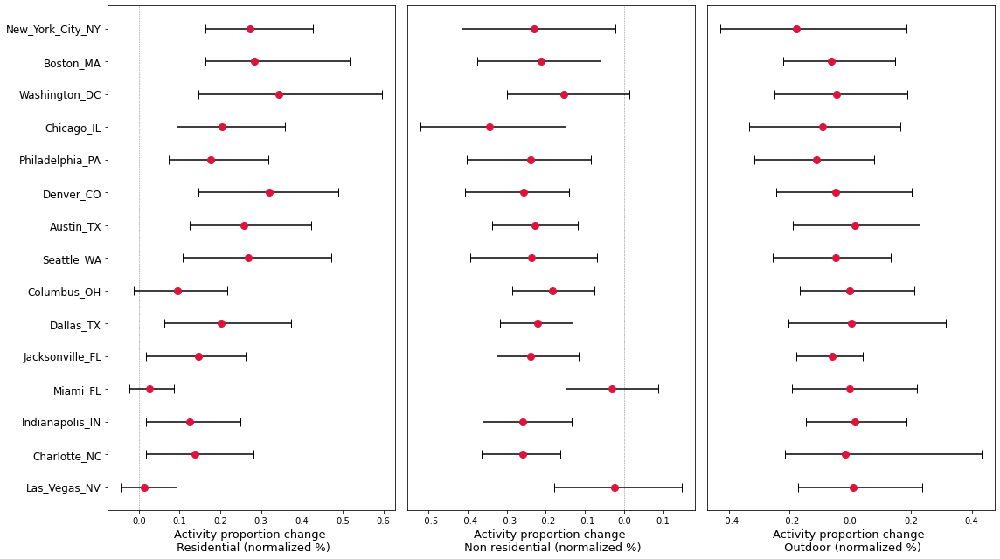

In [9]:
city_list_order = ['Las_Vegas_NV', 'Charlotte_NC', 'Indianapolis_IN', 
                   'Miami_FL', 'Jacksonville_FL', 'Dallas_TX', 'Columbus_OH',
                   'Seattle_WA', 'Austin_TX', 'Denver_CO', 'Philadelphia_PA', 'Chicago_IL', 
                   'Washington_DC', 'Boston_MA', 
                   'New_York_City_NY']

def list_creator(feature):
    d_mean = []
    d_std1 = []
    d_std2 = []
    for city in city_list_order:
        d_mean.append(data[(data['city']==city)][feature].median())
        d_std1.append(data[(data['city']==city)][feature].quantile(0.25))
        d_std2.append(data[(data['city']==city)][feature].quantile(0.75))
    return (d_mean, d_std1, d_std2)
    
plt.figure(figsize=(16,9))
plt.subplot(1,3,1)
d_mean, d_std1, d_std2 = list_creator('p_r_change_1_norm')
for i in range(len(data['city'].unique())):
    plt.plot(d_mean[i], i, marker='o', color='crimson', markersize=8)
    plt.errorbar(d_mean[i], i, xerr= [[d_mean[i]-d_std1[i]],[d_std2[i]-d_mean[i]]], color='K', linewidth=1.5 ,capsize=5)
plt.axvline(0, linestyle='--', color='k', alpha=0.5, linewidth=0.5)
plt.yticks(range(len(city_list_order)), city_list_order, fontsize=12)
plt.xlabel('Activity proportion change \n Residential (normalized %)', fontsize=13)

plt.subplot(1,3,2)
d_mean, d_std1, d_std2 = list_creator('p_nr_change_1_norm')
for i in range(len(data['city'].unique())):
    plt.plot(d_mean[i], i, marker='o', color='crimson', markersize=8)
    plt.errorbar(d_mean[i], i, xerr= [[d_mean[i]-d_std1[i]],[d_std2[i]-d_mean[i]]], color='K', linewidth=1.5 ,capsize=5)
plt.axvline(0, linestyle='--', color='k', alpha=0.5, linewidth=0.5)
plt.yticks([],[])
plt.xlabel('Activity proportion change \n Non residential (normalized %)', fontsize=13)


plt.subplot(1,3,3)
d_mean, d_std1, d_std2 = list_creator('p_o_change_1_norm')
for i in range(len(data['city'].unique())):
    plt.plot(d_mean[i], i, marker='o', color='crimson', markersize=8)
    plt.errorbar(d_mean[i], i, xerr= [[d_mean[i]-d_std1[i]],[d_std2[i]-d_mean[i]]], color='K', linewidth=1.5 ,capsize=5)
    
plt.axvline(0, linestyle='--', color='k', alpha=0.5, linewidth=0.5)
plt.yticks([],[])
plt.xlabel('Activity proportion change \n Outdoor (normalized %)', fontsize=13)

plt.tight_layout()
plt.show()

(-0.8, 0.8)

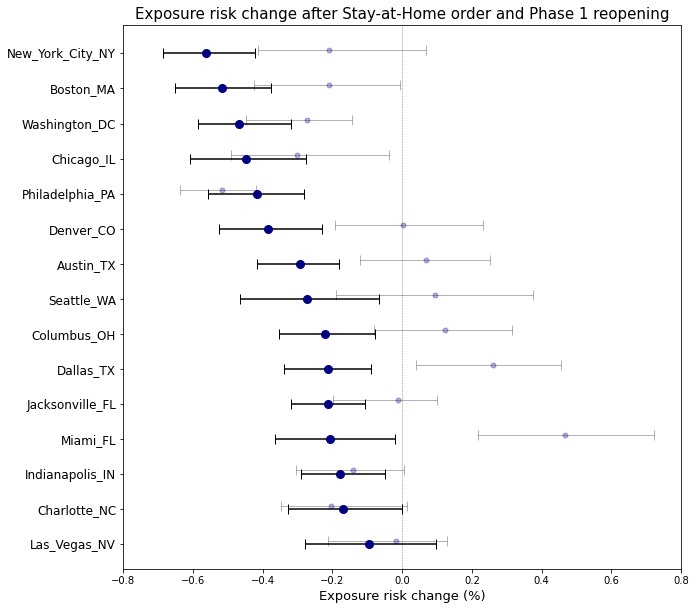

In [10]:
plt.figure(figsize=(10,10))
d_mean, d_std1, d_std2 = list_creator('e_change_1')
for i in range(len(data['city'].unique())):
    plt.plot(d_mean[i], i, marker='o', color='navy', markersize=8, label='SaH')
    plt.errorbar(d_mean[i], i, xerr= [[d_mean[i]-d_std1[i]],[d_std2[i]-d_mean[i]]], color='K', linewidth=1.5 ,capsize=5)
        
d_mean, d_std1, d_std2 = list_creator('e_change_2')
for i in range(len(data['city'].unique())):
    plt.plot(d_mean[i], i+0.1, marker='o', color='navy', markersize=5, alpha=0.3, label='Reopen')
    plt.errorbar(d_mean[i], i+0.1, xerr= [[d_mean[i]-d_std1[i]],[d_std2[i]-d_mean[i]]], color='K', 
                 linewidth=1 ,capsize=5, alpha=0.3)

plt.axvline(0, linestyle='--', color='k', alpha=0.5, linewidth=0.5)
plt.yticks(range(len(city_list_order)), city_list_order, fontsize=12)
plt.xlabel('Exposure risk change (%)', fontsize=13)
plt.title('Exposure risk change after Stay-at-Home order and Phase 1 reopening', fontsize=15)
plt.xlim(-0.8,0.8)

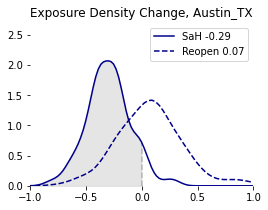

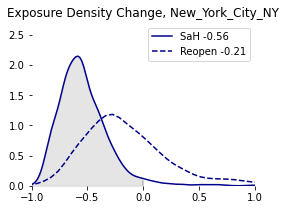

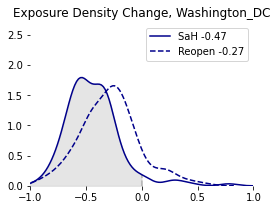

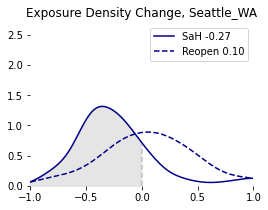

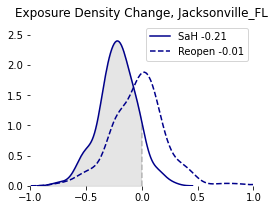

...

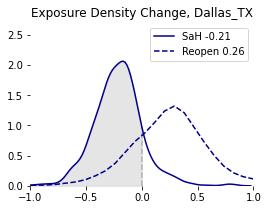

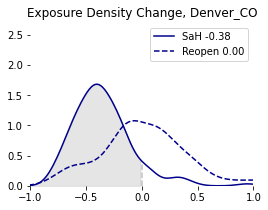

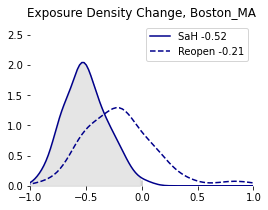

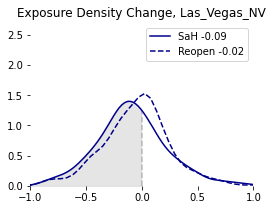

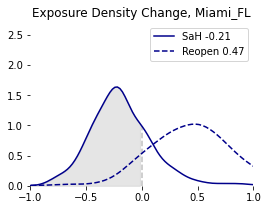

In [11]:
for c in data['city'].unique().tolist():

    f_city = [f for f in folder if c in f][0]
    
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.kdeplot(data['e_change_1'][(data['city']==c)&(data['e_change_1']!=np.inf)], 
                color = 'darkblue', label='SaH %.2f' %data['e_change_1'][data['city']==c].median(), ax=ax, legend=True)
    x = ax.lines[-1].get_xdata()
    y = ax.lines[-1].get_ydata()
    x_special = 0
    ax.vlines(x_special, 0, np.interp(x_special, x, y), linestyle='--', color='grey', alpha=0.5)
    ax.fill_between(x, 0, y, where=x < x_special, color='grey', alpha=0.2)
    plt.xlim(-1, 1)
    plt.ylim(0,2.7)
    plt.box(False)
    plt.title('Exposure Density Change, %s' %c)
    sns.kdeplot(data['e_change_2'][data['city']==c], 
                color = 'darkblue', label='Reopen %.2f' %data['e_change_2'][data['city']==c].median(), ax=ax, legend=True,
               linestyle='--')
    
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exposure_density_change_curve_%s.pdf' %f_city, dpi=300)
#     plt.savefig('../../figure_nature_cities/eda_new_landuse_category/ct_exposure_density_change_curve_%s.svg' %f_city, dpi=300)    

Index(['New_York_City_NY', 'Boston_MA', 'Washington_DC', 'Chicago_IL',
       'Philadelphia_PA', 'Denver_CO', 'Austin_TX', 'Seattle_WA',
       'Columbus_OH', 'Dallas_TX', 'Jacksonville_FL', 'Miami_FL',
       'Indianapolis_IN', 'Charlotte_NC', 'Las_Vegas_NV'],
      dtype='object')


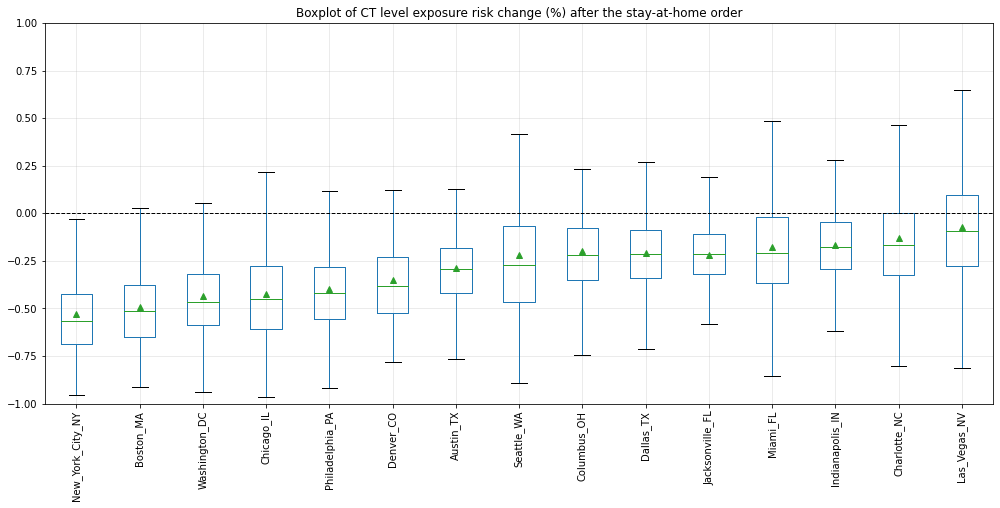

In [12]:
def boxplot_sorted(df, by, column, rot=0):
    # use dict comprehension to create new dataframe from the iterable groupby object
    # each group name becomes a column in the new dataframe
    df2 = pd.DataFrame({col:vals[column] for col, vals in df.groupby(by)})
    # find and sort the median values in this new dataframe
    meds = df2.median().sort_values()
    # use the columns in the dataframe, ordered sorted by median value
    # return axes so changes can be made outside the function
    print (meds.index)
    return df2[meds.index].boxplot(rot=rot, return_type="axes", showmeans=True,
                                  showfliers=False)
     
plt.figure(figsize=(17,7))
axes = boxplot_sorted(data[(~data['city'].isin(['Houston_TX','San_Diego_CA',
                         'Los_Angeles_CA',
                         'San_Francisco_CA']))&(data['e_change_1']!=np.inf)], by=["city"], column="e_change_1",
                     )

axes.set_title("Boxplot of CT level exposure risk change (%) after the stay-at-home order")
axes.set_ylim([-1,1])
plt.xticks(rotation=90)
plt.grid(alpha=0.3)
plt.axhline(0, color='k', linewidth=1, linestyle='--')
plt.show()